In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import torch
import torch.utils.data
from scipy.io import loadmat
from skimage import io
import spectral

In [2]:
from scipy.io import loadmat, whosmat

# Inspect the contents of the .mat file
mat_contents_img = whosmat(r"C:\Users\ursti\Downloads\GAN\Datasets\IndianPines\Indian_pines_corrected.mat")
mat_contents_gt = whosmat(r"C:\Users\ursti\Downloads\GAN\Datasets\IndianPines\Indian_pines_gt.mat")

print(mat_contents_img)
print(mat_contents_gt)

[('indian_pines_corrected', (145, 145, 200), 'double')]
[('indian_pines_gt', (145, 145), 'double')]


In [3]:
img = loadmat(r"C:\Users\ursti\Downloads\GAN\Datasets\IndianPines\Indian_pines_corrected.mat")['indian_pines_corrected']
gt = loadmat(r"C:\Users\ursti\Downloads\GAN\Datasets\IndianPines\Indian_pines_gt.mat")['indian_pines_gt']

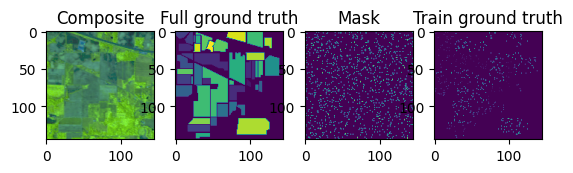

In [4]:
mask = np.random.randint(0, 100, gt.shape) < 5
train_gt = np.copy(gt)
train_gt[np.nonzero(~mask)] = 0
test_gt = np.copy(gt)
test_gt[train_gt > 0] = 0

rgb = img[:,:,(55,41,12)]
rgb = (255 * (rgb.astype(np.float32) - rgb.min())/(rgb.max() - rgb.min())).astype(np.uint8)
fig = plt.figure()
fig.add_subplot(141)
plt.imshow(rgb)
plt.title("Composite")
fig.add_subplot(142)
plt.imshow(gt)
plt.title("Full ground truth")
fig.add_subplot(143)
plt.imshow(mask)
plt.title("Mask")
fig.add_subplot(144)
plt.imshow(train_gt)
plt.title("Train ground truth")
plt.show()

In [5]:
from skimage import morphology

class HyperX(torch.utils.data.Dataset):
    
    def __init__(self, data, ground_truth, semi=False):
        super(HyperX, self).__init__()
        # Normalize the data in [0,1]
        data = (data - data.min()) / (data.max() - data.min())
        self.data = data
        self.gt = ground_truth
        self.n_classes = len(np.unique(ground_truth))
        if semi:
            # Semi-supervision, include neighbours at 50px
            x_pos, y_pos = np.nonzero(morphology.dilation(ground_truth > 0, morphology.disk(50)))
        else:
            x_pos, y_pos = np.nonzero(ground_truth)
        self.indices = [idx for idx in zip(x_pos, y_pos)]
    
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, i):
        x, y = self.indices[i]
        data = self.data[x,y]
        # Get the label in one-hot encoded style
        label = np.asarray(np.eye(self.n_classes)[self.gt[x, y]], dtype='int64')
        return torch.from_numpy(data), torch.from_numpy(label)

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm

        
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(
            nn.Linear(z_dim + c_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               
            nn.Linear(h_dim, h_dim),  
            nn.SELU(),               
            nn.Linear(h_dim, h_dim),  
            nn.SELU(),             
            nn.Linear(h_dim, X_dim),
            nn.Sigmoid()
        )
        self.apply(weight_init)

    def forward(self, z, c):
        inputs = torch.cat([z, c], dim=1)
        return self.generator(inputs)
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(
            nn.Linear(X_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),               
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, 1)
        )
        self.apply(weight_init)

    def forward(self, x):
        return self.discriminator(x)
    
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(X_dim, h_dim),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.BatchNorm1d(h_dim),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, h_dim),  
            nn.ELU(),                
            nn.Linear(h_dim, c_dim)
        )
        self.apply(weight_init)

    def forward(self, x):
        return self.classifier(x)


In [7]:
mb_size = 256 # Batch size
z_dim = 30   # Noise dimension
X_dim = img.shape[-1] # Number of bands
h_dim = 512  # Hidden layer size
d_step = 5   # Number of discriminator training steps for each generator training step
lr = 5e-5    # Learning rate
c_weight = 0.2 # Auxiliary classifier weight
flip_percentage = 0.0 # Proportion of label flipping
mixup_alpha = 0.1 # Mixup
semi_supervised = True # semi-supervision (set to True to include unlabeled samples)

# Build the dataset and data loader
data_loader = torch.utils.data.DataLoader(
    HyperX(img, train_gt if semi_supervised else gt), batch_size=mb_size, shuffle=True)
# c_dim = condition vector size
c_dim = data_loader.dataset.n_classes

# Ignore the class 0
class_weights = torch.ones((c_dim))
class_weights[0] = 0.
class_weights = class_weights.cuda()

In [8]:
# Initialize weights using the He et al. (2015) policy.
def weight_init(m):
    if isinstance(m, (nn.Linear, nn.Conv2d, nn.Conv3d, nn.ConvTranspose3d)):
        torch.nn.init.kaiming_normal_(m.weight.data)

# Spherical interpolation between two vectors on the unit hypersphere
# See : https://github.com/soumith/dcgan.torch/issues/14
def slerp(val, low, high):
    omega = np.arccos(np.clip(np.dot(low/np.linalg.norm(low), high/np.linalg.norm(high)), -1, 1))
    so = np.sin(omega)
    if so == 0:
        return (1.0-val) * low + val * high # L'Hopital's rule/LERP
    return np.sin((1.0-val)*omega) / so * low + np.sin(val*omega) / so * high

def lerp(val, low, high):
    return (1.0-val) * low + val * high # L'Hopital's rule/LERP

# Gradient penalty from the Improved WGAN training
# From : https://github.com/EmilienDupont/wgan-gp
# Use penalty_weight set at 10, as suggested in the paper
def calc_gradient_penalty(netD, real_data, generated_data, penalty_weight=10):
        batch_size = real_data.size()[0]

        alpha = torch.rand(batch_size, 1) if real_data.dim() == 2 else torch.rand(batch_size, 1, 1, 1)
        alpha = alpha.expand_as(real_data)
        alpha = alpha.cuda()
        
        interpolated = alpha * real_data + (1 - alpha) * generated_data
        #interpolated = Variable(interpolated, requires_grad=True)
        interpolated.requires_grad_()
        interpolated = interpolated.cuda()

        # Calculate probability of interpolated examples
        prob_interpolated = netD(interpolated)

        # Calculate gradients of probabilities with respect to examples
        gradients = torch.autograd.grad(outputs=prob_interpolated, inputs=interpolated,
                               grad_outputs=torch.ones(prob_interpolated.size()).cuda(),
                               create_graph=True, retain_graph=True)[0]

        # Gradients have shape (batch_size, num_channels, img_width, img_height),
        # so flatten to easily take norm per example in batch
        gradients = gradients.view(batch_size, -1)

        # Derivatives of the gradient close to 0 can cause problems because of
        # the square root, so manually calculate norm and add epsilon
        gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)

        # Return gradient penalty
        return penalty_weight * ((gradients_norm - 1) ** 2).mean()
    
def reset_grad(*nets):
    for net in nets:
        net.zero_grad()
        
def plot_mean_std(samples):
    mean_spectrum = np.mean(samples, axis=0)
    std_spectrum = np.std(samples, axis=0)
    plt.plot(mean_spectrum - std_spectrum, linestyle='dotted', label='-std')
    plt.plot(mean_spectrum, label='mean')
    plt.plot(mean_spectrum + std_spectrum, linestyle='dotted', label='+std')

  0%|                                                                                       | 0/100000 [00:00<?, ?it/s]C:\Users\ursti\AppData\Local\Temp\ipykernel_12912\1864507184.py:65: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  pred = F.log_softmax(C(X))


Iter-0; D_loss: 22.84662628173828; G_loss: -1.3258566856384277; C_loss: 4.4084296226501465


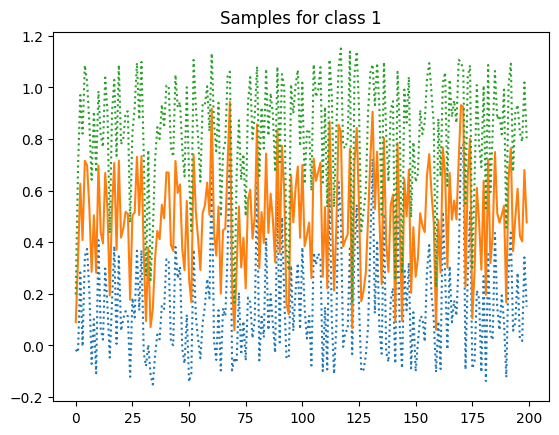

  1%|▋                                                                          | 999/100000 [01:30<2:22:52, 11.55it/s]

Iter-1000; D_loss: -3.5896589756011963; G_loss: 1.0096745491027832; C_loss: 2.2102785110473633


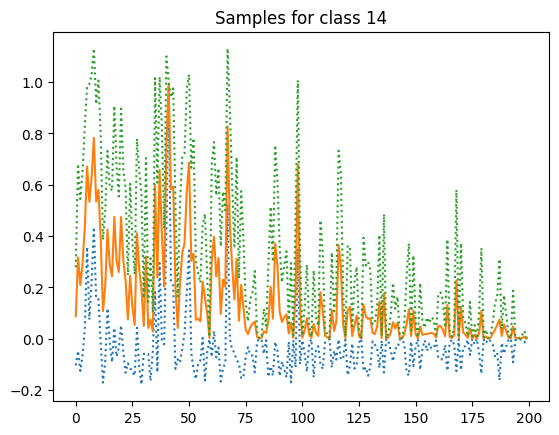

  2%|█▍                                                                        | 1999/100000 [03:12<2:31:14, 10.80it/s]

Iter-2000; D_loss: -3.8410747051239014; G_loss: -0.8226868510246277; C_loss: 5.874128341674805


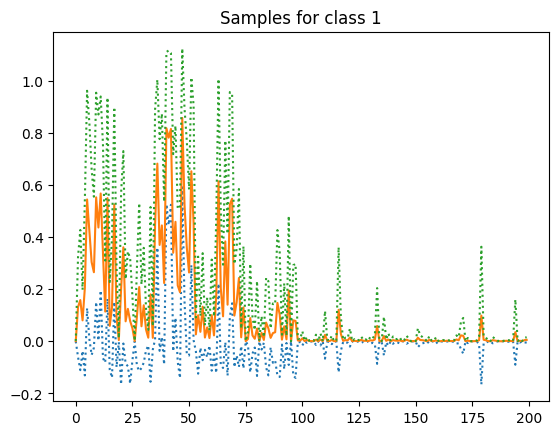

  3%|██▏                                                                       | 3000/100000 [05:09<5:30:10,  4.90it/s]

Iter-3000; D_loss: -3.8067498207092285; G_loss: -2.0203804969787598; C_loss: 1.070841908454895


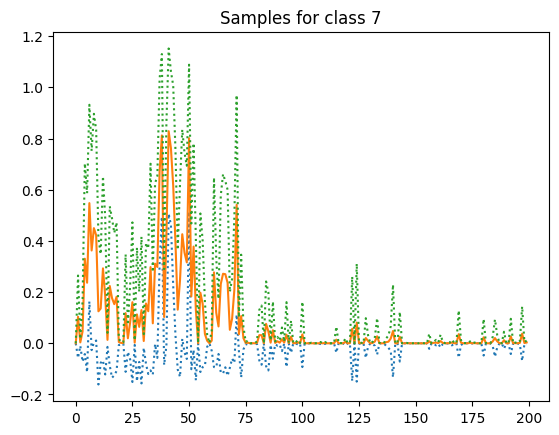

  4%|██▉                                                                       | 4000/100000 [08:06<4:34:31,  5.83it/s]

Iter-4000; D_loss: -3.678809642791748; G_loss: -3.752054452896118; C_loss: 2.040308713912964


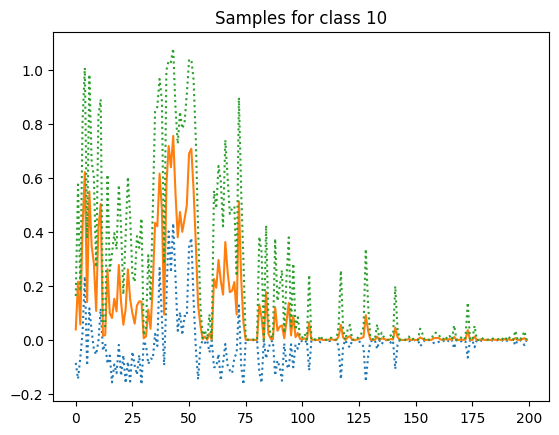

  5%|███▋                                                                      | 5000/100000 [10:00<2:22:25, 11.12it/s]

Iter-5000; D_loss: -3.28739333152771; G_loss: -3.309791088104248; C_loss: 2.2446327209472656


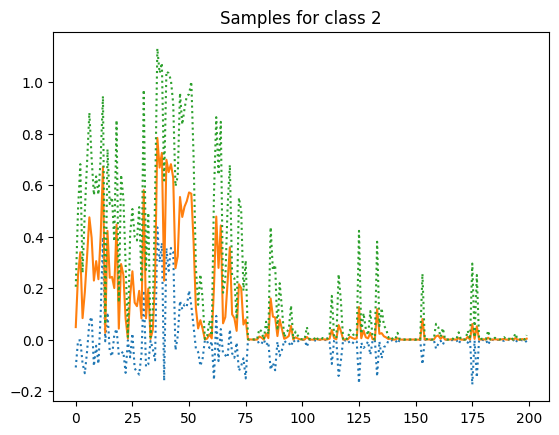

  6%|████▍                                                                     | 6000/100000 [11:38<2:34:56, 10.11it/s]

Iter-6000; D_loss: -3.41518235206604; G_loss: -1.9967122077941895; C_loss: 4.039795398712158


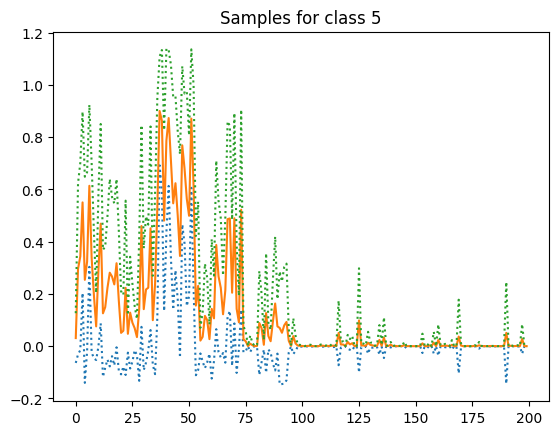

  7%|█████▏                                                                    | 7000/100000 [13:14<2:30:45, 10.28it/s]

Iter-7000; D_loss: -2.9013547897338867; G_loss: -1.8929784297943115; C_loss: 4.204828262329102


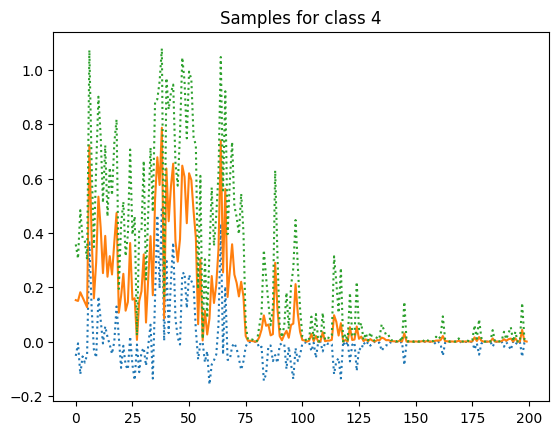

  8%|█████▉                                                                    | 7999/100000 [14:50<2:15:17, 11.33it/s]

Iter-8000; D_loss: -3.0358948707580566; G_loss: -1.6852846145629883; C_loss: 2.580670118331909


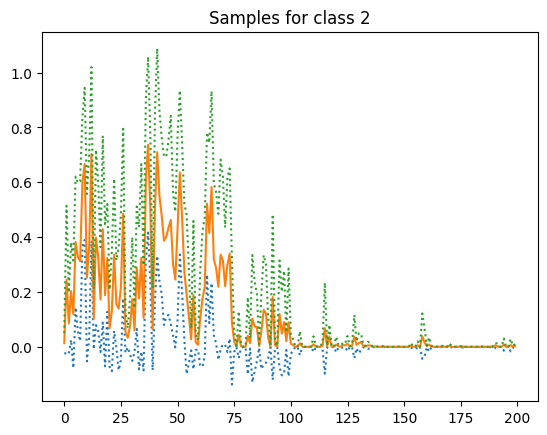

  9%|██████▋                                                                   | 8999/100000 [16:27<2:25:40, 10.41it/s]

Iter-9000; D_loss: -2.715424060821533; G_loss: -1.6104366779327393; C_loss: 4.376883506774902


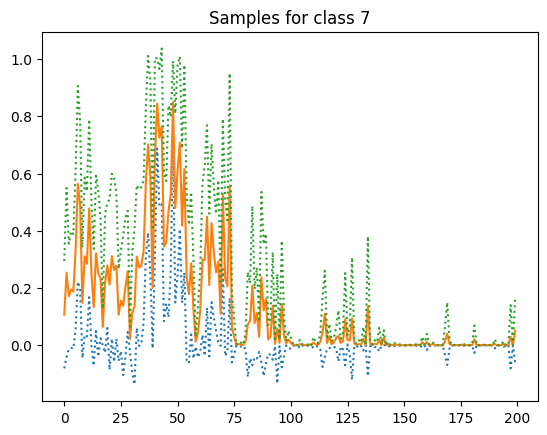

 10%|███████▍                                                                  | 9999/100000 [18:04<2:22:11, 10.55it/s]

Iter-10000; D_loss: -2.2670254707336426; G_loss: -2.5455188751220703; C_loss: 0.7264477014541626


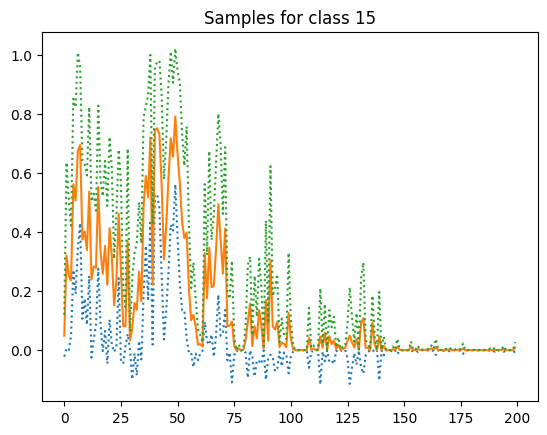

 11%|████████                                                                 | 10999/100000 [19:42<2:48:25,  8.81it/s]

Iter-11000; D_loss: -2.805361747741699; G_loss: -3.259343147277832; C_loss: 2.4028706550598145


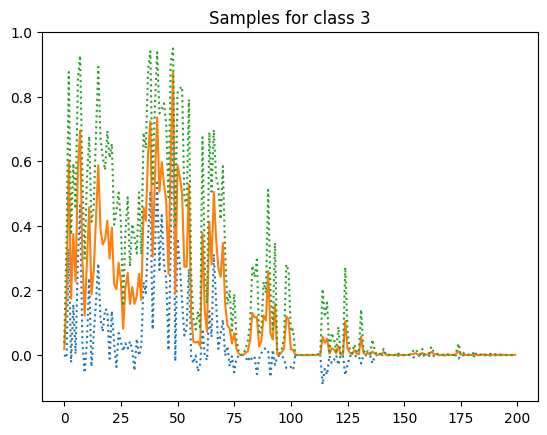

 12%|████████▊                                                                | 12000/100000 [21:22<2:47:07,  8.78it/s]

Iter-12000; D_loss: -2.2587890625; G_loss: -3.6929678916931152; C_loss: 2.2995567321777344


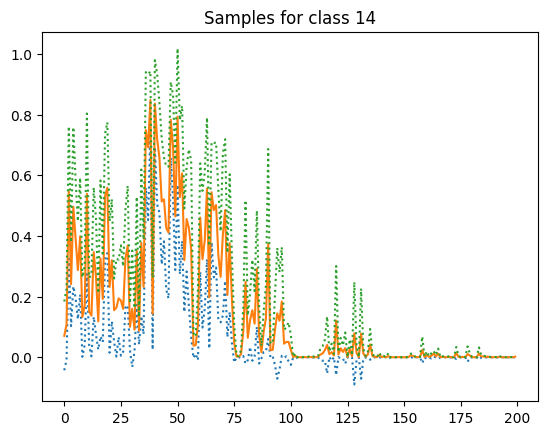

 13%|█████████▍                                                               | 12999/100000 [23:11<2:19:07, 10.42it/s]

Iter-13000; D_loss: -1.994044542312622; G_loss: -2.610947608947754; C_loss: 2.7352135181427


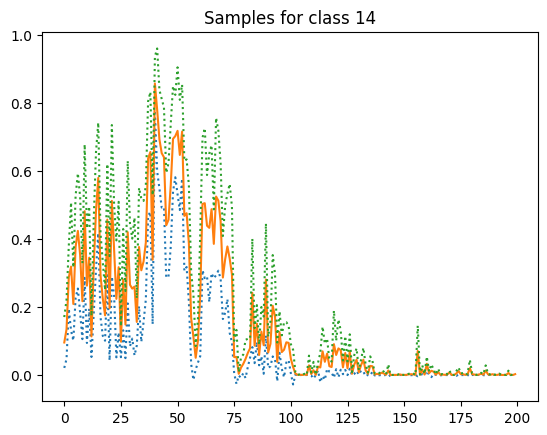

 14%|██████████▏                                                              | 13999/100000 [24:46<2:26:44,  9.77it/s]

Iter-14000; D_loss: -1.3200716972351074; G_loss: -2.275909900665283; C_loss: 2.174008846282959


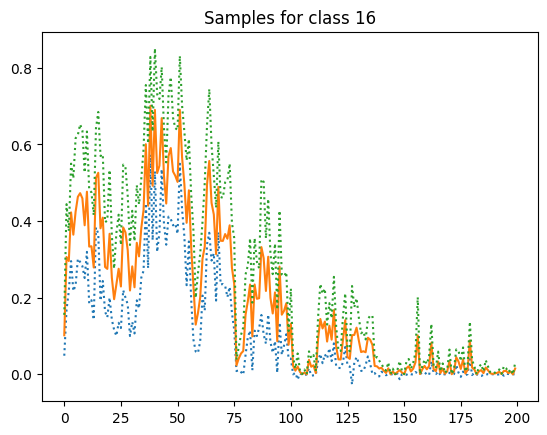

 15%|██████████▉                                                              | 14999/100000 [26:23<2:17:10, 10.33it/s]

Iter-15000; D_loss: -1.1063294410705566; G_loss: -0.37588435411453247; C_loss: 4.872966289520264


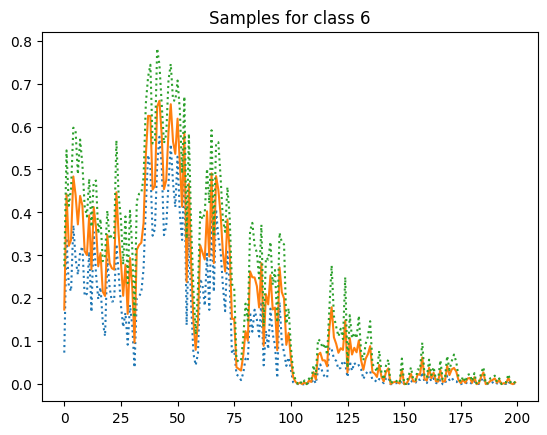

 16%|███████████▋                                                             | 16000/100000 [28:01<2:12:44, 10.55it/s]

Iter-16000; D_loss: -1.0223660469055176; G_loss: -1.810228705406189; C_loss: 3.2559289932250977


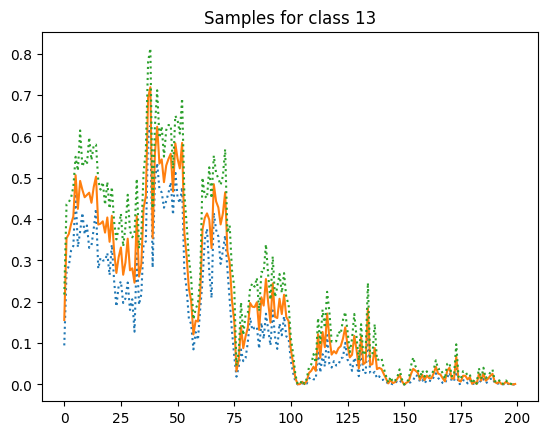

 17%|████████████▍                                                            | 17000/100000 [29:37<2:56:28,  7.84it/s]

Iter-17000; D_loss: -0.6669175624847412; G_loss: -2.49332332611084; C_loss: 1.3165963888168335


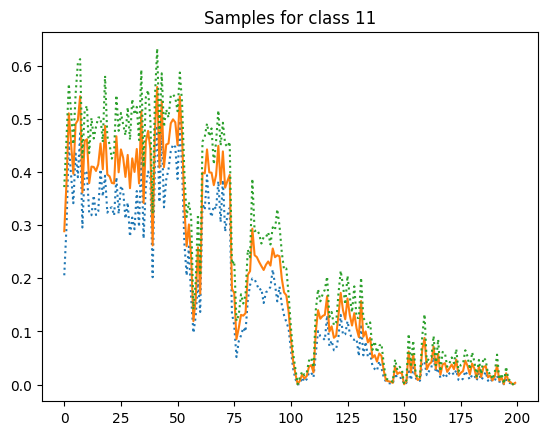

 18%|█████████████▏                                                           | 18000/100000 [31:14<2:09:05, 10.59it/s]

Iter-18000; D_loss: -0.8360764980316162; G_loss: -3.5254299640655518; C_loss: 0.7113310694694519


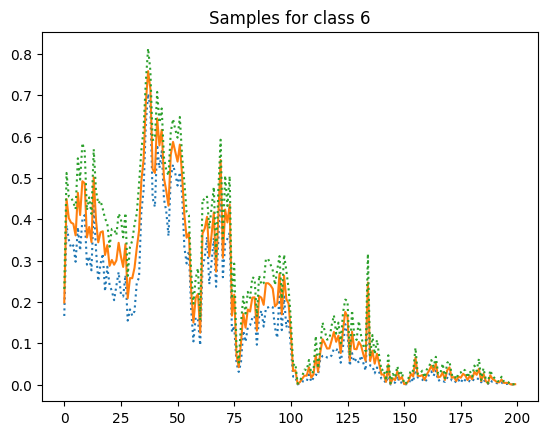

 19%|█████████████▊                                                           | 19000/100000 [32:51<2:03:16, 10.95it/s]

Iter-19000; D_loss: -0.7123017311096191; G_loss: -2.3302087783813477; C_loss: 2.1884849071502686


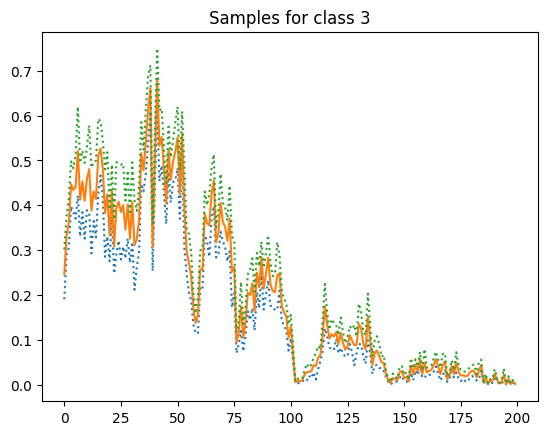

 20%|██████████████▌                                                          | 20000/100000 [34:28<2:05:07, 10.66it/s]

Iter-20000; D_loss: -0.854465126991272; G_loss: -3.075711727142334; C_loss: 0.7642462253570557


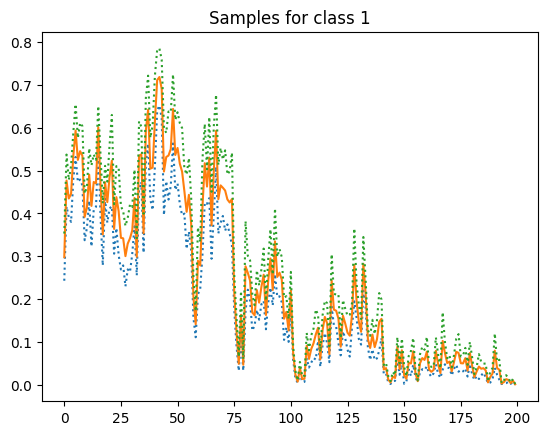

 21%|███████████████▎                                                         | 21000/100000 [36:06<2:04:13, 10.60it/s]

Iter-21000; D_loss: -0.9687049388885498; G_loss: -2.736069679260254; C_loss: 3.335334539413452


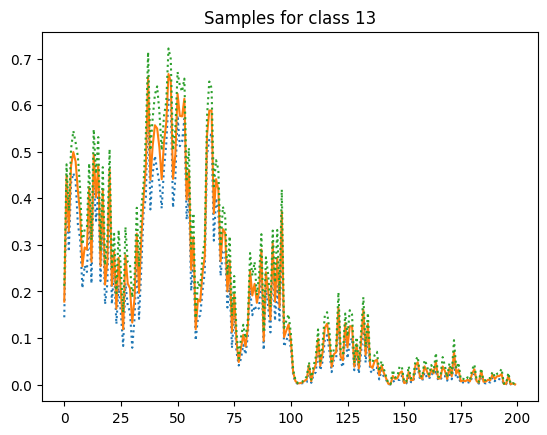

 22%|████████████████                                                         | 22000/100000 [37:44<1:55:07, 11.29it/s]

Iter-22000; D_loss: -0.7170767784118652; G_loss: -4.2492523193359375; C_loss: 2.2555997371673584


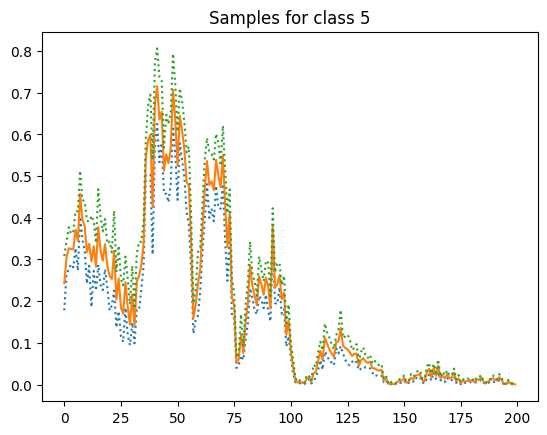

 23%|████████████████▊                                                        | 22999/100000 [39:21<1:54:27, 11.21it/s]

Iter-23000; D_loss: -0.3979760706424713; G_loss: -4.93630313873291; C_loss: 1.6955218315124512


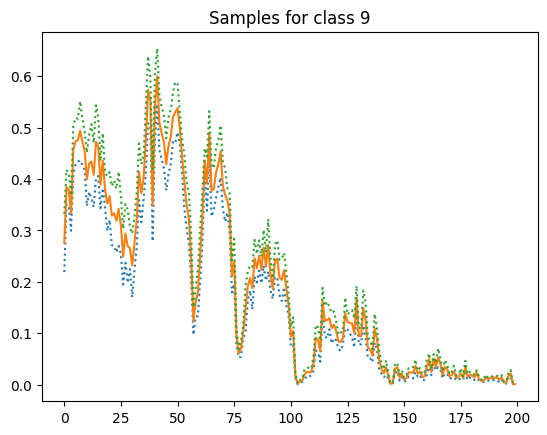

 24%|█████████████████▌                                                       | 24000/100000 [40:59<2:19:39,  9.07it/s]

Iter-24000; D_loss: -0.571208119392395; G_loss: -4.296212196350098; C_loss: 2.7505178451538086


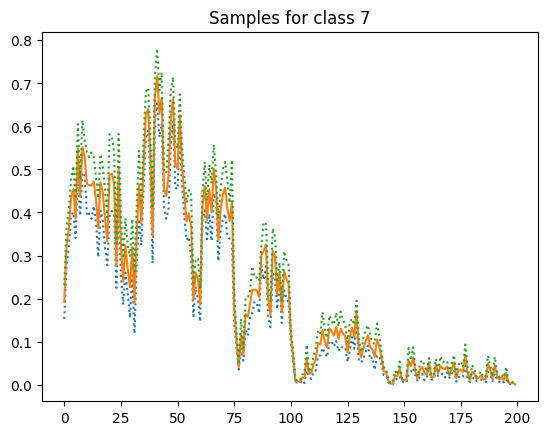

 25%|██████████████████▏                                                      | 24999/100000 [42:38<1:58:35, 10.54it/s]

Iter-25000; D_loss: -0.6065715551376343; G_loss: -4.869794845581055; C_loss: 0.8766510486602783


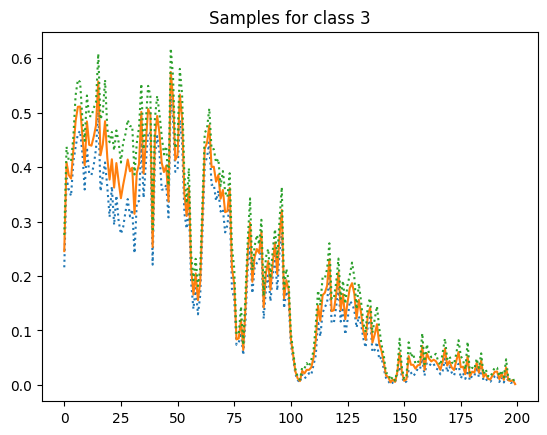

 26%|██████████████████▉                                                      | 25999/100000 [44:14<1:53:29, 10.87it/s]

Iter-26000; D_loss: -0.49345144629478455; G_loss: -6.357609272003174; C_loss: 1.0361878871917725


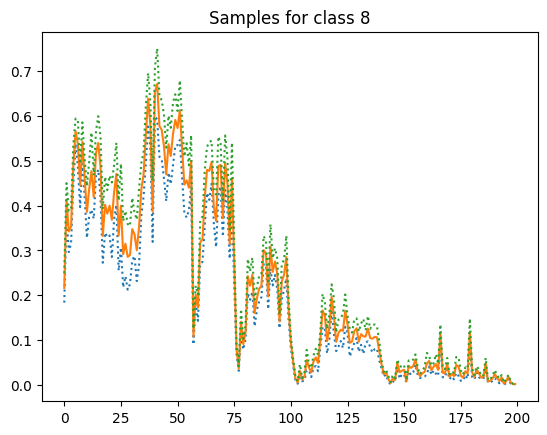

 27%|███████████████████▋                                                     | 27000/100000 [45:52<1:51:22, 10.92it/s]

Iter-27000; D_loss: -0.5106821060180664; G_loss: -7.474932670593262; C_loss: 0.9125936627388


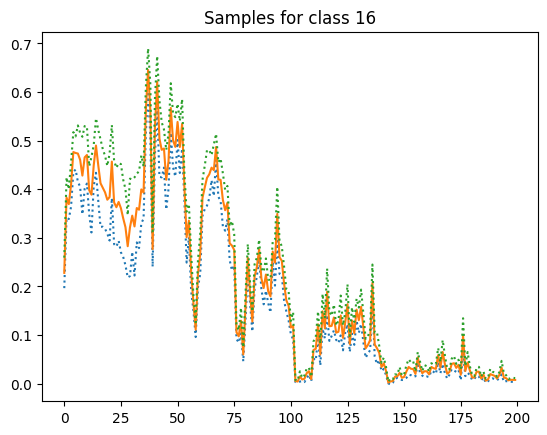

 28%|████████████████████▍                                                    | 28000/100000 [47:29<1:55:12, 10.42it/s]

Iter-28000; D_loss: -0.5139636397361755; G_loss: -7.46237850189209; C_loss: 0.32793381810188293


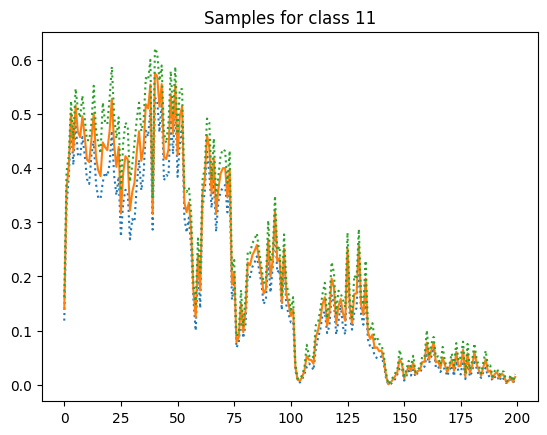

 29%|█████████████████████▏                                                   | 28999/100000 [49:07<1:56:50, 10.13it/s]

Iter-29000; D_loss: -0.639922022819519; G_loss: -8.679597854614258; C_loss: 2.003300189971924


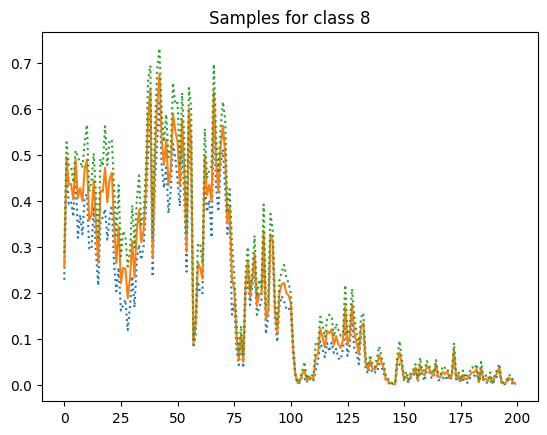

 30%|█████████████████████▉                                                   | 30000/100000 [50:46<1:52:34, 10.36it/s]

Iter-30000; D_loss: -0.6753256320953369; G_loss: -10.675609588623047; C_loss: 1.2688125371932983


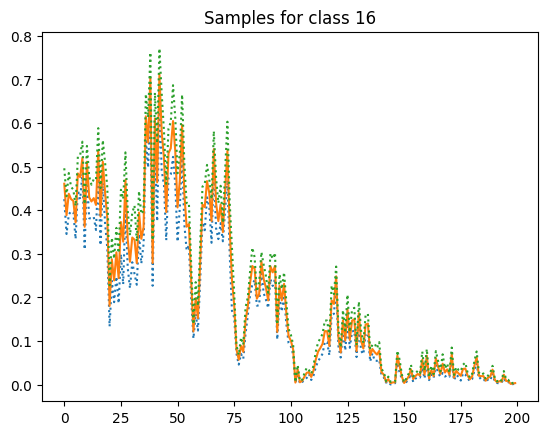

 31%|██████████████████████▋                                                  | 30999/100000 [52:22<1:53:00, 10.18it/s]

Iter-31000; D_loss: -0.3567926585674286; G_loss: -10.887596130371094; C_loss: 0.8230547904968262


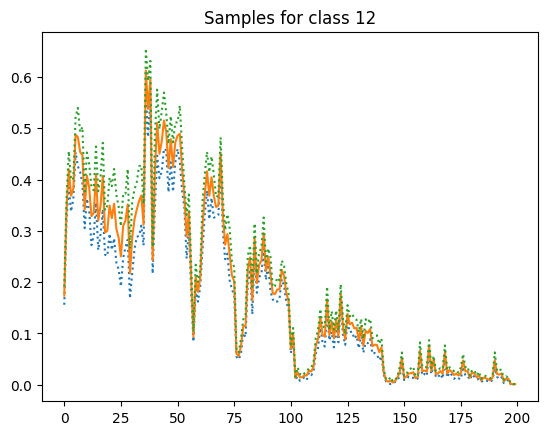

 32%|███████████████████████▎                                                 | 32000/100000 [54:00<1:46:50, 10.61it/s]

Iter-32000; D_loss: -0.5760906338691711; G_loss: -14.302712440490723; C_loss: 0.4299110174179077


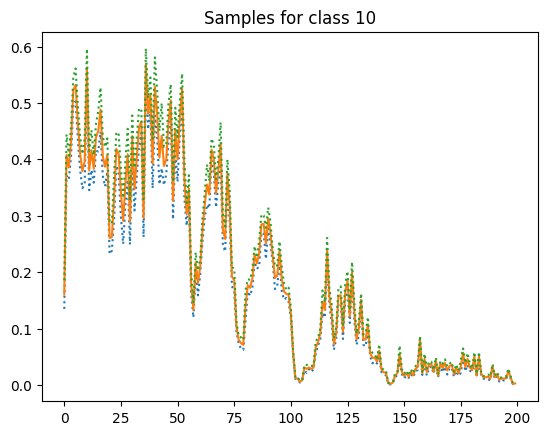

 33%|████████████████████████                                                 | 33000/100000 [55:38<1:56:40,  9.57it/s]

Iter-33000; D_loss: -0.48345425724983215; G_loss: -16.402008056640625; C_loss: 2.489626407623291


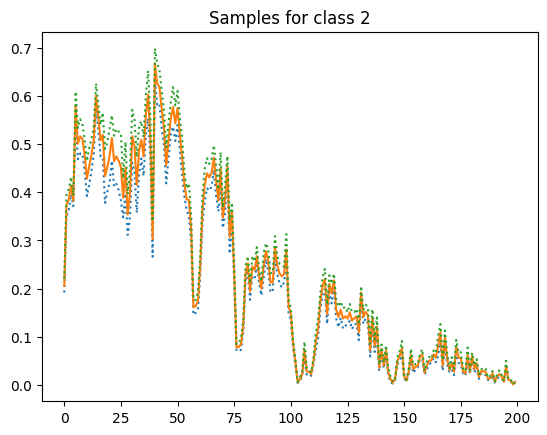

 34%|████████████████████████▊                                                | 34000/100000 [57:15<1:48:18, 10.16it/s]

Iter-34000; D_loss: -0.33032992482185364; G_loss: -18.060043334960938; C_loss: 0.35449641942977905


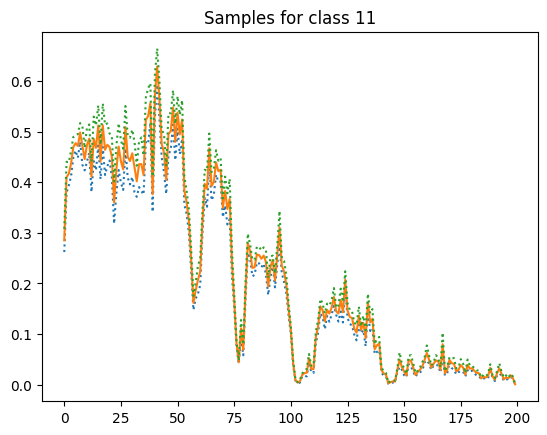

 35%|█████████████████████████▌                                               | 34999/100000 [58:53<1:46:29, 10.17it/s]

Iter-35000; D_loss: -0.44023337960243225; G_loss: -21.041255950927734; C_loss: 1.547159194946289


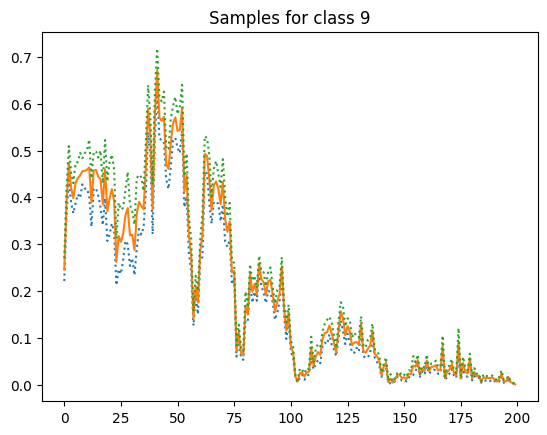

 36%|█████████████████████████▌                                             | 35999/100000 [1:00:31<1:39:13, 10.75it/s]

Iter-36000; D_loss: -0.45294371247291565; G_loss: -23.032608032226562; C_loss: 2.650818347930908


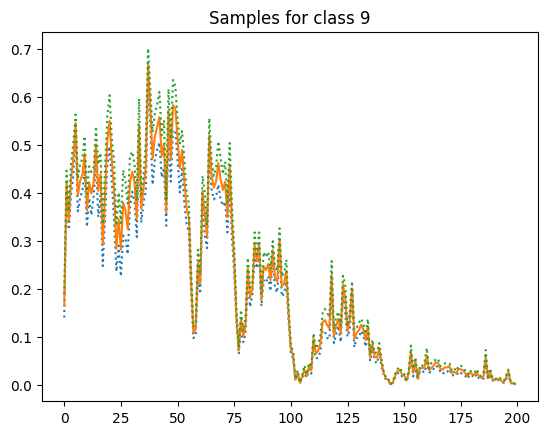

 37%|██████████████████████████▎                                            | 37000/100000 [1:02:10<3:09:55,  5.53it/s]

Iter-37000; D_loss: -0.6193133592605591; G_loss: -25.426212310791016; C_loss: 1.4172803163528442


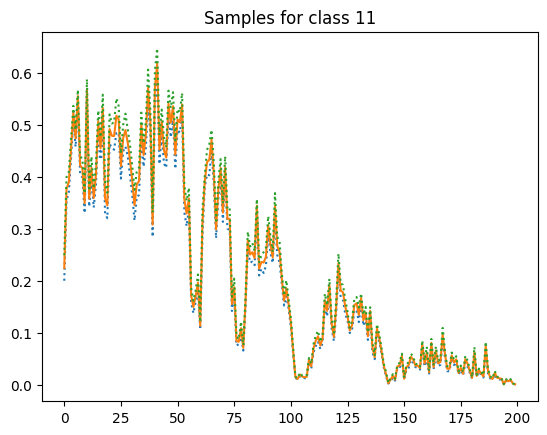

 38%|██████████████████████████▉                                            | 38000/100000 [1:03:48<1:38:00, 10.54it/s]

Iter-38000; D_loss: -0.38790079951286316; G_loss: -27.05343246459961; C_loss: 0.36720675230026245


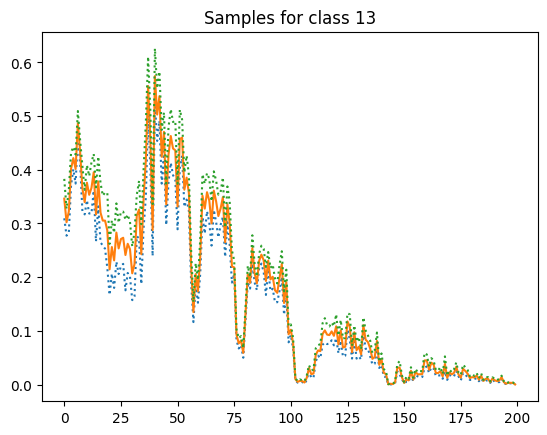

 39%|███████████████████████████▋                                           | 39000/100000 [1:05:26<1:40:55, 10.07it/s]

Iter-39000; D_loss: -0.33411914110183716; G_loss: -29.238414764404297; C_loss: 0.969576358795166


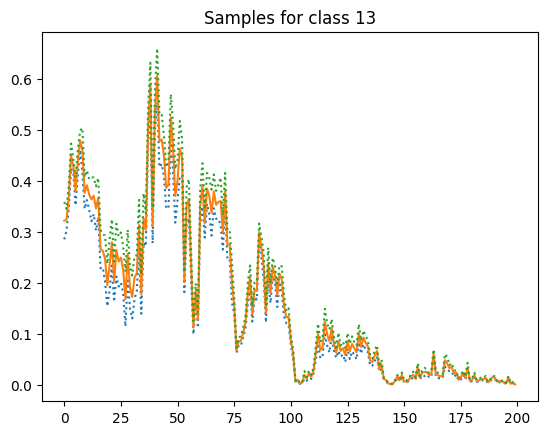

 40%|████████████████████████████▍                                          | 40000/100000 [1:07:04<1:31:48, 10.89it/s]

Iter-40000; D_loss: -0.3690488934516907; G_loss: -30.670013427734375; C_loss: 2.2474050521850586


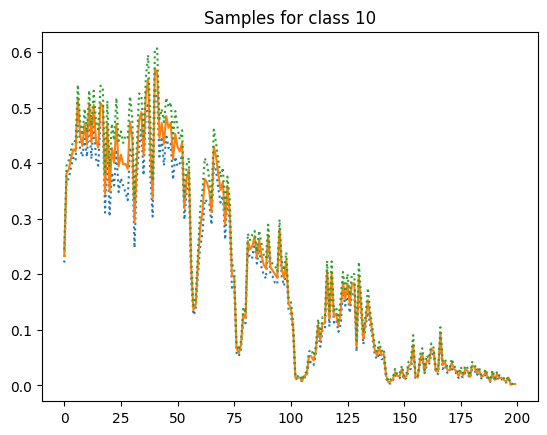

 41%|█████████████████████████████                                          | 40999/100000 [1:08:41<1:41:30,  9.69it/s]

Iter-41000; D_loss: -0.5654551982879639; G_loss: -31.93498992919922; C_loss: 0.49189063906669617


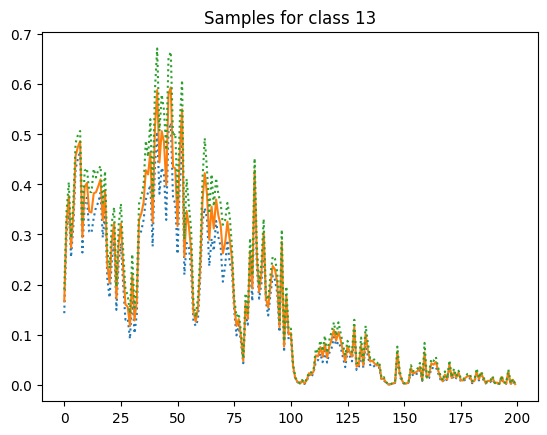

 42%|█████████████████████████████▊                                         | 42000/100000 [1:10:20<1:30:30, 10.68it/s]

Iter-42000; D_loss: -0.528862476348877; G_loss: -33.127159118652344; C_loss: 3.319295883178711


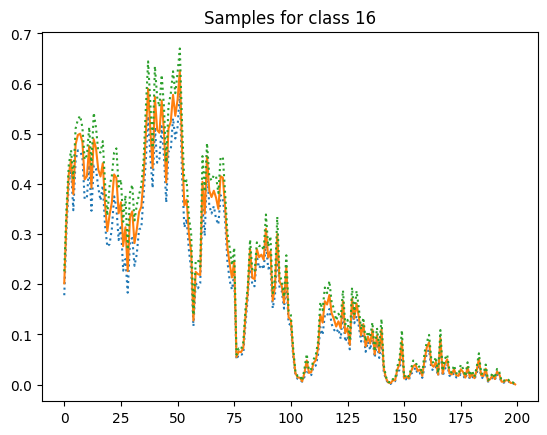

 43%|██████████████████████████████▌                                        | 42999/100000 [1:11:57<1:23:11, 11.42it/s]

Iter-43000; D_loss: -0.46018290519714355; G_loss: -33.391571044921875; C_loss: 2.750979423522949


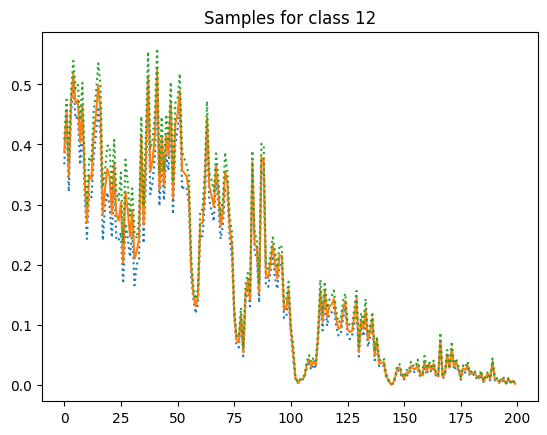

 44%|███████████████████████████████▏                                       | 44000/100000 [1:13:34<1:32:32, 10.09it/s]

Iter-44000; D_loss: -0.47599199414253235; G_loss: -34.506385803222656; C_loss: 0.7344613075256348


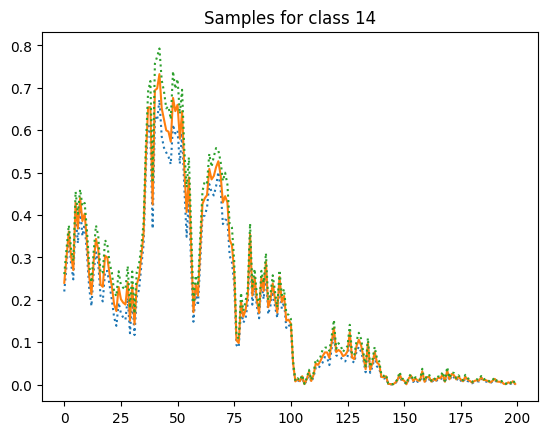

 45%|███████████████████████████████▉                                       | 44999/100000 [1:15:11<1:20:53, 11.33it/s]

Iter-45000; D_loss: -0.4297369420528412; G_loss: -34.668617248535156; C_loss: 2.930894374847412


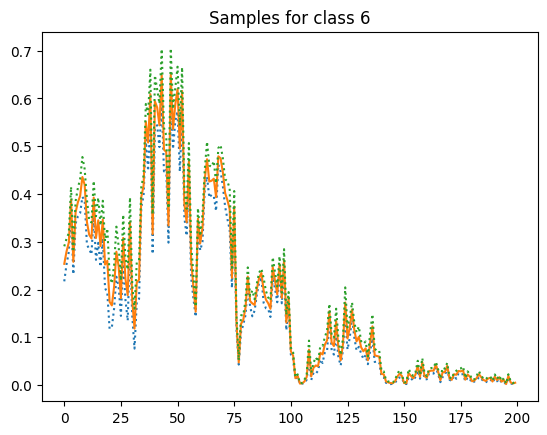

 46%|████████████████████████████████▋                                      | 46000/100000 [1:16:49<1:23:23, 10.79it/s]

Iter-46000; D_loss: -0.293413907289505; G_loss: -35.84123229980469; C_loss: 1.421345591545105


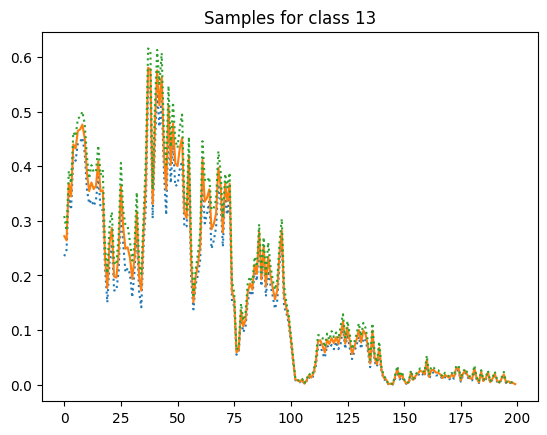

 47%|█████████████████████████████████▎                                     | 46999/100000 [1:18:30<1:17:56, 11.33it/s]

Iter-47000; D_loss: -0.48264607787132263; G_loss: -35.2087516784668; C_loss: 0.21046526730060577


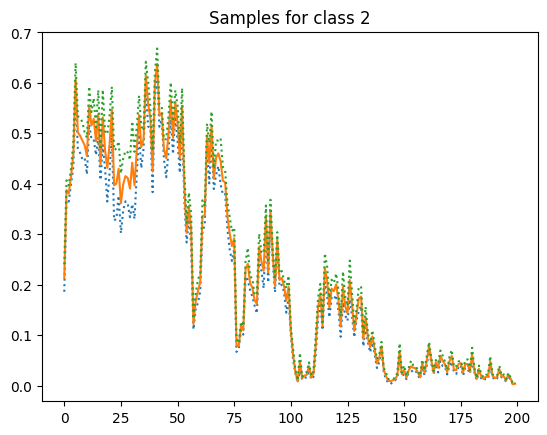

 48%|██████████████████████████████████                                     | 47999/100000 [1:20:07<1:19:19, 10.93it/s]

Iter-48000; D_loss: -0.4164639711380005; G_loss: -35.08094787597656; C_loss: 1.9605547189712524


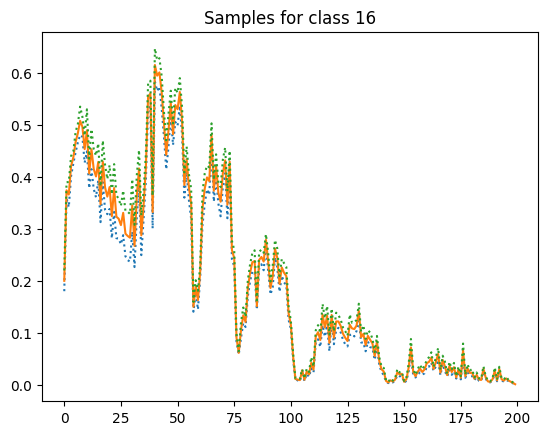

 49%|██████████████████████████████████▊                                    | 49000/100000 [1:21:46<1:22:05, 10.35it/s]

Iter-49000; D_loss: -0.34959855675697327; G_loss: -35.745330810546875; C_loss: 0.7957130670547485


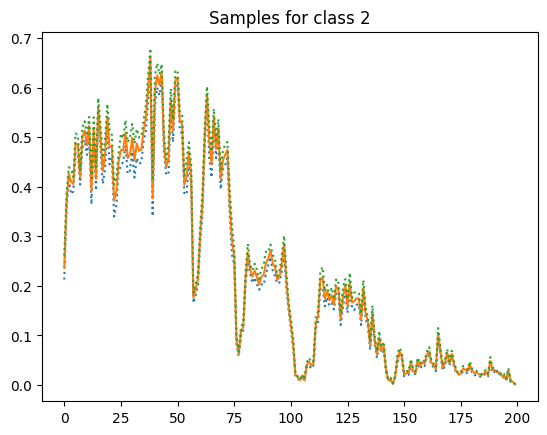

 50%|███████████████████████████████████▌                                   | 50000/100000 [1:23:23<1:18:43, 10.59it/s]

Iter-50000; D_loss: -0.3650195896625519; G_loss: -35.69813919067383; C_loss: 0.5627763271331787


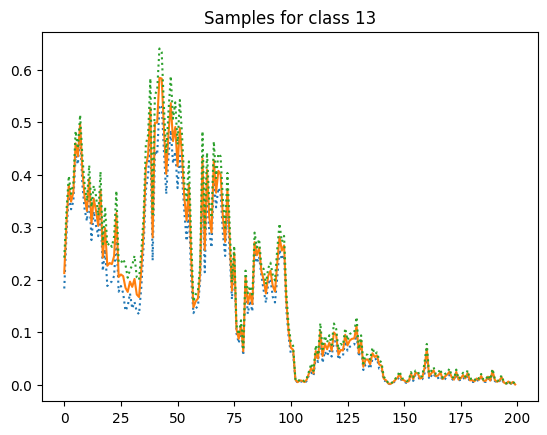

 51%|████████████████████████████████████▏                                  | 51000/100000 [1:25:02<1:15:57, 10.75it/s]

Iter-51000; D_loss: -0.2363552451133728; G_loss: -35.75529479980469; C_loss: 1.964225172996521


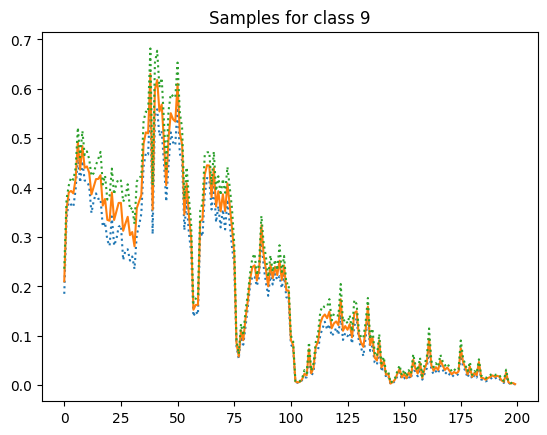

 52%|████████████████████████████████████▉                                  | 51999/100000 [1:26:40<1:14:15, 10.77it/s]

Iter-52000; D_loss: -0.5437819957733154; G_loss: -35.796607971191406; C_loss: 0.7980102896690369


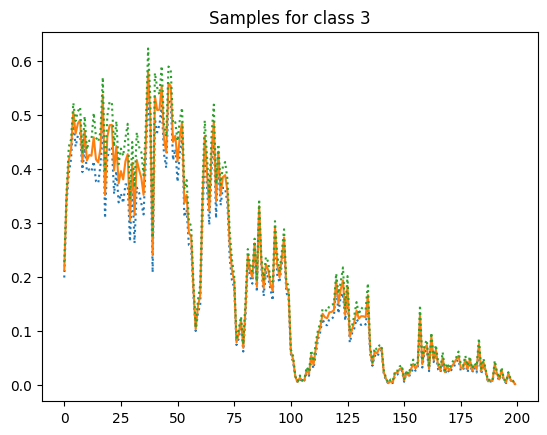

 53%|█████████████████████████████████████▋                                 | 52999/100000 [1:28:17<1:16:16, 10.27it/s]

Iter-53000; D_loss: -0.3974902927875519; G_loss: -35.430206298828125; C_loss: 0.7313960790634155


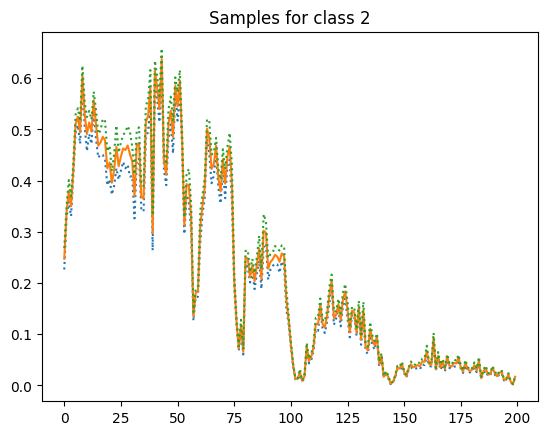

 54%|██████████████████████████████████████▎                                | 54000/100000 [1:29:57<1:14:15, 10.32it/s]

Iter-54000; D_loss: -0.29994475841522217; G_loss: -34.914573669433594; C_loss: 0.6861022710800171


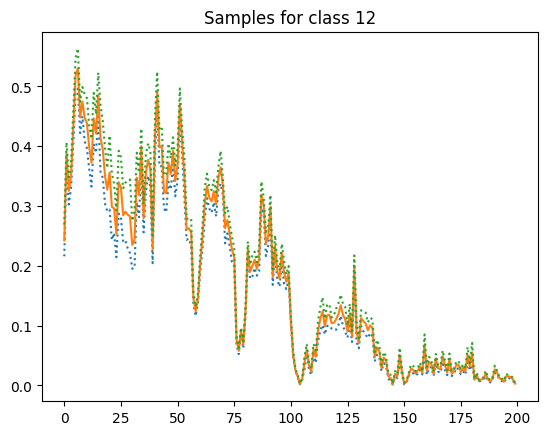

 55%|███████████████████████████████████████                                | 54999/100000 [1:31:35<1:08:15, 10.99it/s]

Iter-55000; D_loss: -0.6485673189163208; G_loss: -34.453102111816406; C_loss: 1.9526431560516357


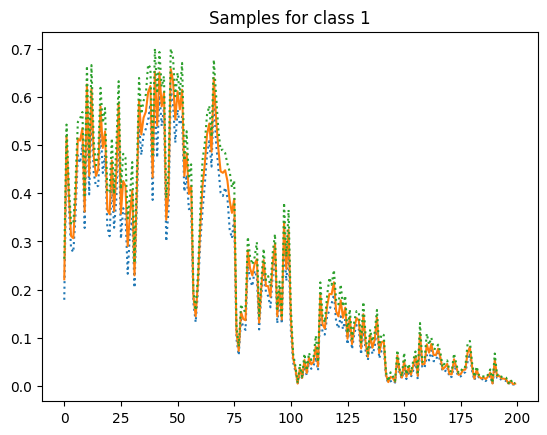

 56%|███████████████████████████████████████▊                               | 55999/100000 [1:33:13<1:12:50, 10.07it/s]

Iter-56000; D_loss: -0.4669530987739563; G_loss: -34.271907806396484; C_loss: 1.5471594333648682


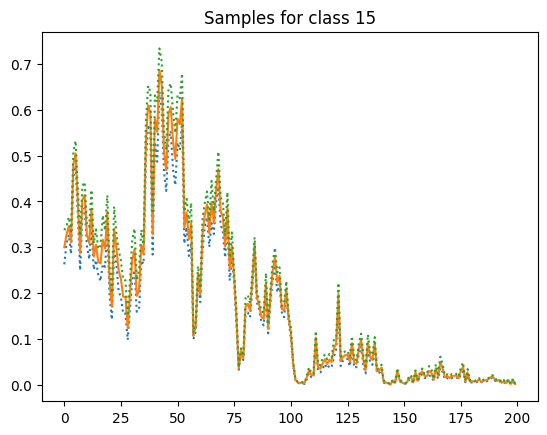

 57%|████████████████████████████████████████▍                              | 56999/100000 [1:34:51<1:04:40, 11.08it/s]

Iter-57000; D_loss: -0.26367679238319397; G_loss: -34.37471008300781; C_loss: 0.6115715503692627


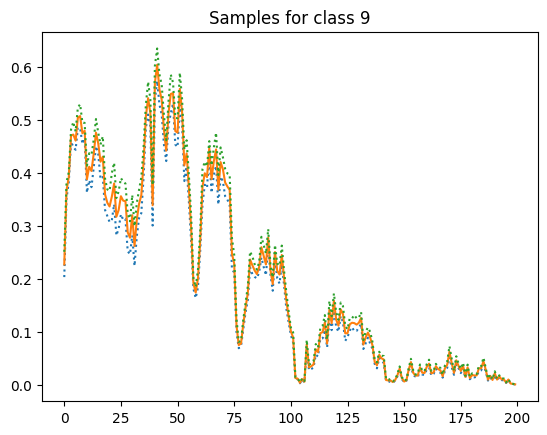

 58%|██████████████████████████████████████████▎                              | 58000/100000 [1:36:29<58:57, 11.87it/s]

Iter-58000; D_loss: -0.31876760721206665; G_loss: -33.65583419799805; C_loss: 2.070190906524658


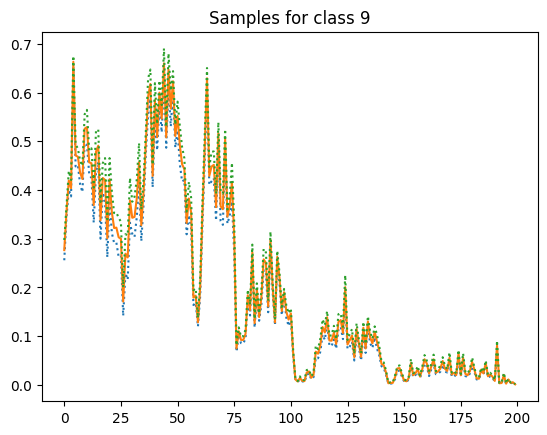

 59%|█████████████████████████████████████████▉                             | 58999/100000 [1:38:06<1:00:05, 11.37it/s]

Iter-59000; D_loss: -0.3035010099411011; G_loss: -32.619285583496094; C_loss: 2.7817187309265137


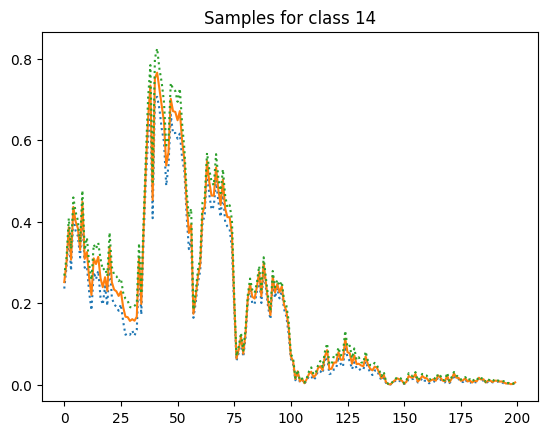

 60%|██████████████████████████████████████████▌                            | 60000/100000 [1:39:44<1:22:22,  8.09it/s]

Iter-60000; D_loss: -0.4459080398082733; G_loss: -32.565406799316406; C_loss: 1.3674591779708862


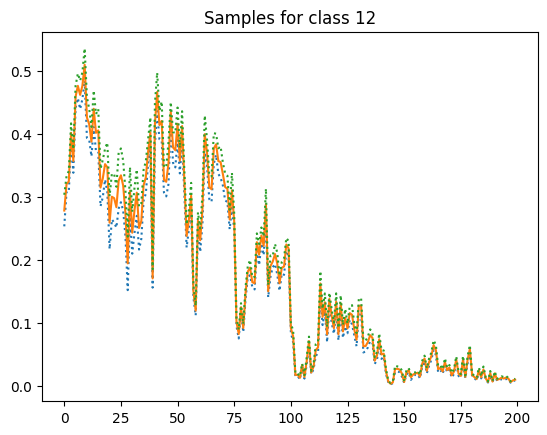

 61%|███████████████████████████████████████████▎                           | 60999/100000 [1:41:21<1:02:08, 10.46it/s]

Iter-61000; D_loss: -0.49872881174087524; G_loss: -31.287944793701172; C_loss: 0.8533153533935547


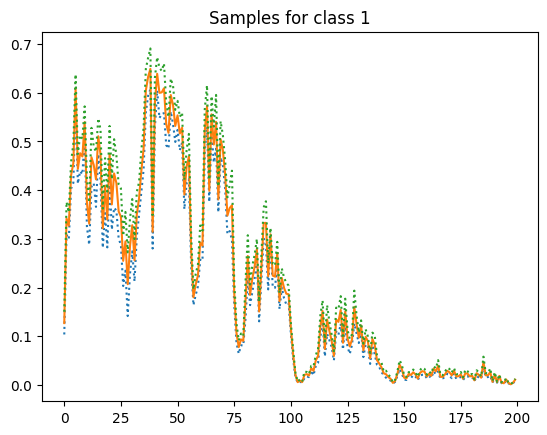

 62%|████████████████████████████████████████████                           | 62000/100000 [1:42:59<1:16:37,  8.27it/s]

Iter-62000; D_loss: -0.3652549386024475; G_loss: -30.556007385253906; C_loss: 0.6458525061607361


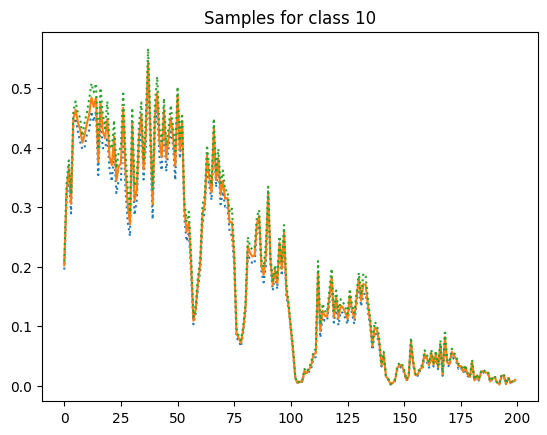

 63%|█████████████████████████████████████████████▉                           | 62999/100000 [1:44:36<57:44, 10.68it/s]

Iter-63000; D_loss: -0.1979297250509262; G_loss: -29.69487953186035; C_loss: 1.7118568420410156


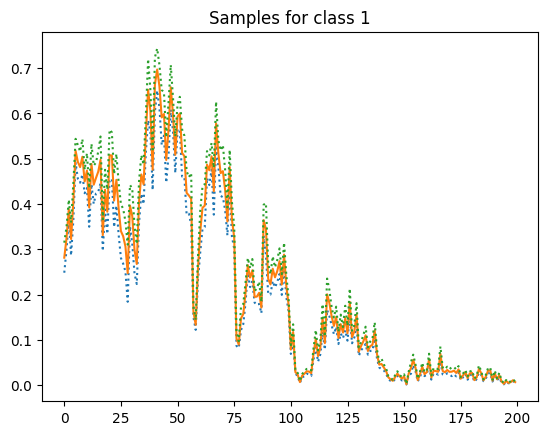

 64%|██████████████████████████████████████████████▋                          | 63999/100000 [1:46:14<57:25, 10.45it/s]

Iter-64000; D_loss: -0.43542763590812683; G_loss: -28.421627044677734; C_loss: 2.581637382507324


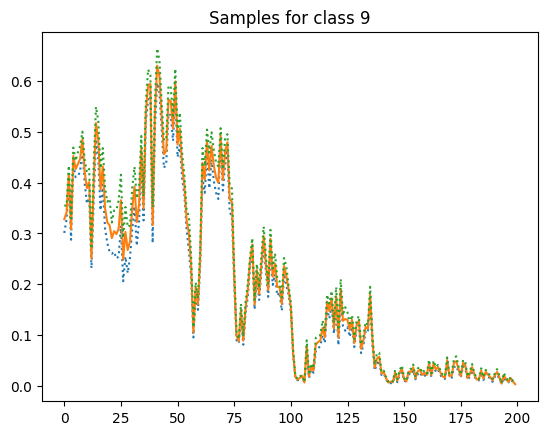

 65%|███████████████████████████████████████████████▍                         | 64999/100000 [1:47:53<58:35,  9.96it/s]

Iter-65000; D_loss: -0.3187447786331177; G_loss: -27.611454010009766; C_loss: 0.5613420605659485


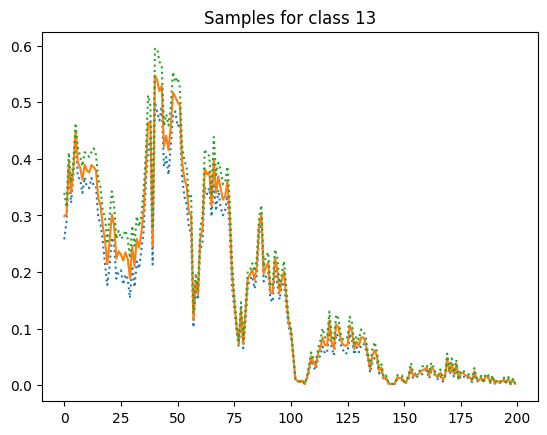

 66%|████████████████████████████████████████████████▏                        | 65999/100000 [1:49:31<52:27, 10.80it/s]

Iter-66000; D_loss: -0.629956841468811; G_loss: -26.81158447265625; C_loss: 1.2394516468048096


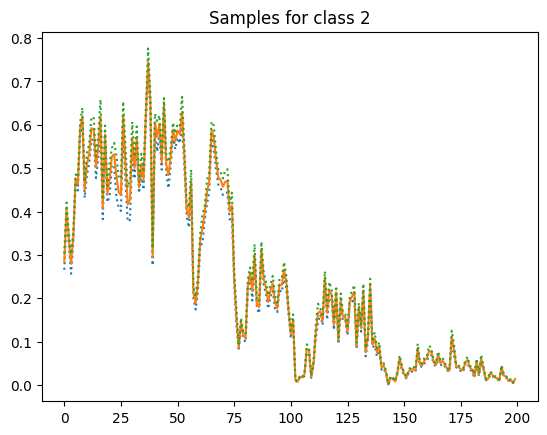

 67%|████████████████████████████████████████████████▉                        | 67000/100000 [1:51:11<53:02, 10.37it/s]

Iter-67000; D_loss: -0.31551387906074524; G_loss: -25.814220428466797; C_loss: 1.3734111785888672


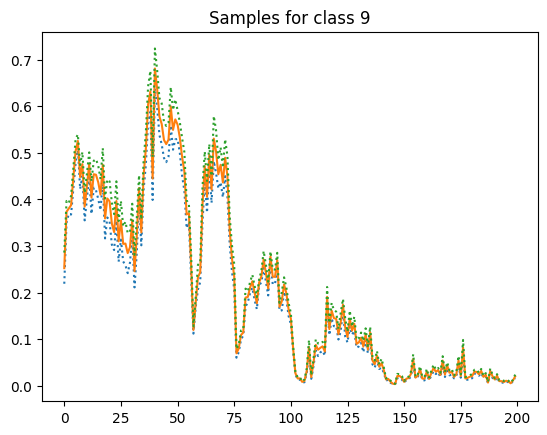

 68%|█████████████████████████████████████████████████▋                       | 68000/100000 [1:52:47<51:39, 10.32it/s]

Iter-68000; D_loss: -0.47665444016456604; G_loss: -24.85274887084961; C_loss: 1.0064733028411865


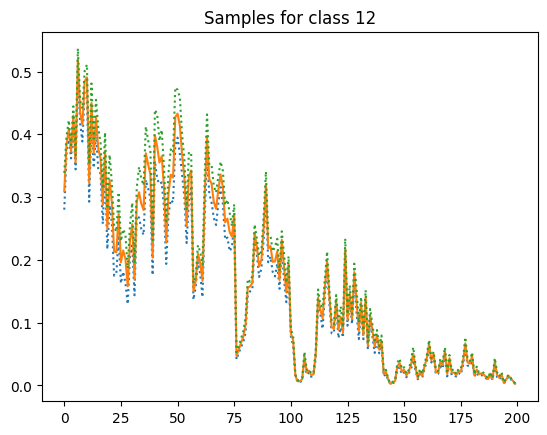

 69%|██████████████████████████████████████████████████▎                      | 68999/100000 [1:54:24<49:46, 10.38it/s]

Iter-69000; D_loss: -0.3859562575817108; G_loss: -24.355945587158203; C_loss: 0.7631908059120178


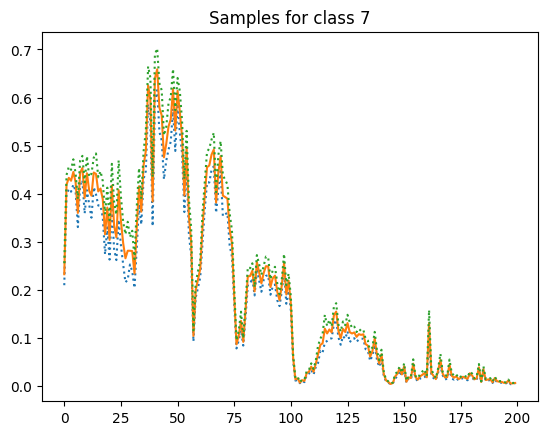

 70%|███████████████████████████████████████████████████                      | 70000/100000 [1:56:02<51:24,  9.73it/s]

Iter-70000; D_loss: -0.3321552276611328; G_loss: -23.96999740600586; C_loss: 0.4282958507537842


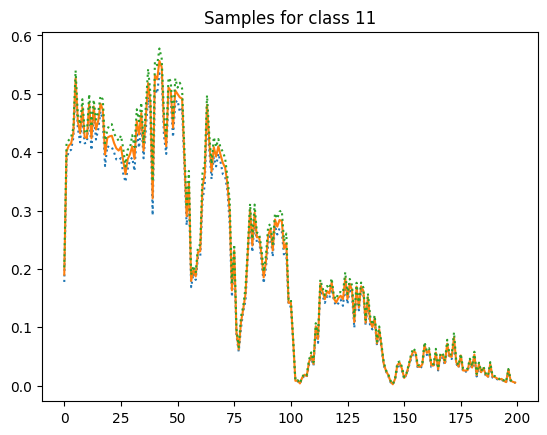

 71%|███████████████████████████████████████████████████▊                     | 71000/100000 [1:57:39<45:26, 10.63it/s]

Iter-71000; D_loss: -0.3430160880088806; G_loss: -22.637535095214844; C_loss: 0.3345968425273895


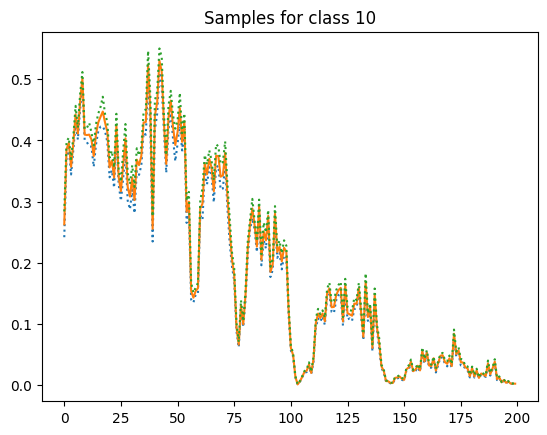

 72%|████████████████████████████████████████████████████▌                    | 71999/100000 [1:59:16<44:33, 10.47it/s]

Iter-72000; D_loss: -0.3795677125453949; G_loss: -21.684274673461914; C_loss: 1.4351454973220825


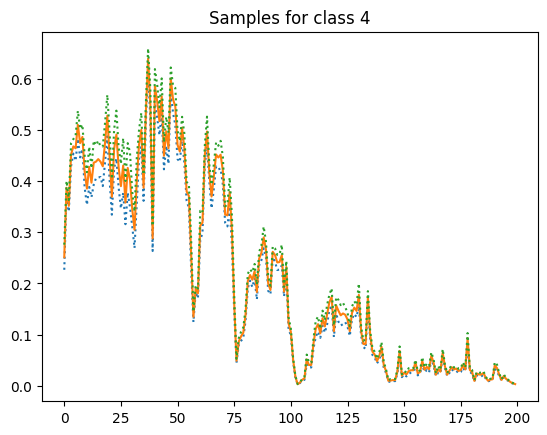

 73%|█████████████████████████████████████████████████████▎                   | 73000/100000 [2:00:54<41:58, 10.72it/s]

Iter-73000; D_loss: -0.3223843574523926; G_loss: -20.706249237060547; C_loss: 0.6301774382591248


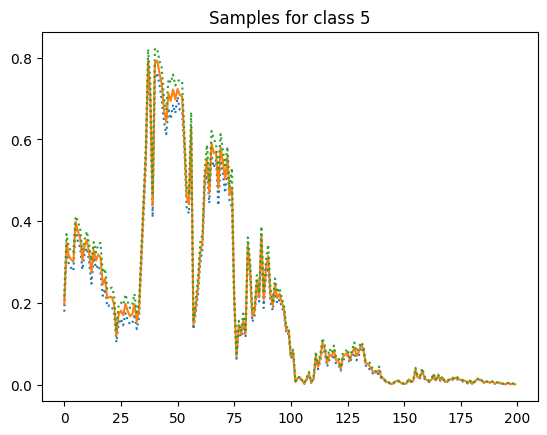

 74%|██████████████████████████████████████████████████████                   | 73999/100000 [2:02:32<42:41, 10.15it/s]

Iter-74000; D_loss: -0.5290003418922424; G_loss: -19.75011444091797; C_loss: 1.5176646709442139


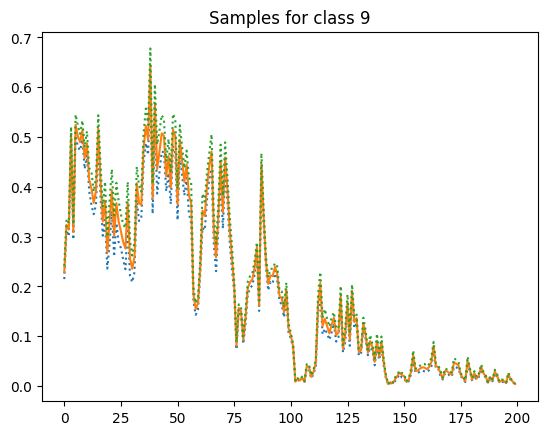

 75%|██████████████████████████████████████████████████████▋                  | 74999/100000 [2:04:10<40:12, 10.36it/s]

Iter-75000; D_loss: -0.5678365230560303; G_loss: -18.235679626464844; C_loss: 0.7233480215072632


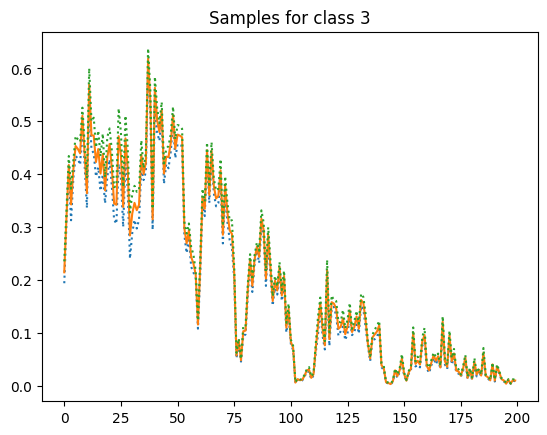

 76%|███████████████████████████████████████████████████████▍                 | 76000/100000 [2:05:47<36:54, 10.84it/s]

Iter-76000; D_loss: -0.4177580177783966; G_loss: -17.553606033325195; C_loss: 1.1689196825027466


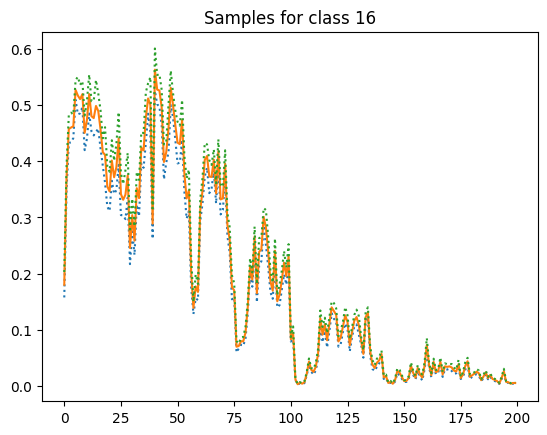

 77%|████████████████████████████████████████████████████████▏                | 76999/100000 [2:07:27<37:14, 10.29it/s]

Iter-77000; D_loss: -0.3400183320045471; G_loss: -16.52692222595215; C_loss: 0.9812430143356323


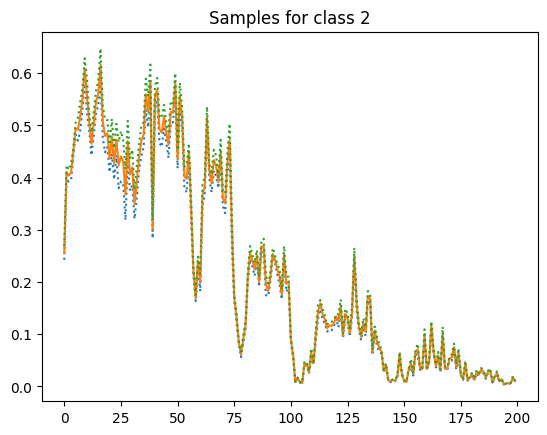

 78%|████████████████████████████████████████████████████████▉                | 77999/100000 [2:09:05<39:00,  9.40it/s]

Iter-78000; D_loss: -0.4401213526725769; G_loss: -15.654916763305664; C_loss: 0.21527348458766937


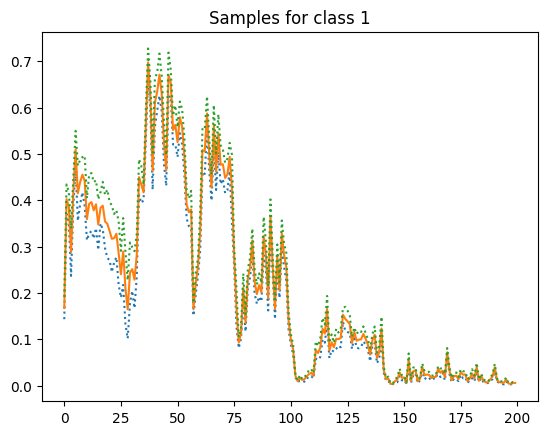

 79%|█████████████████████████████████████████████████████████▋               | 78999/100000 [2:10:43<34:17, 10.21it/s]

Iter-79000; D_loss: -0.477967768907547; G_loss: -14.442651748657227; C_loss: 0.030435465276241302


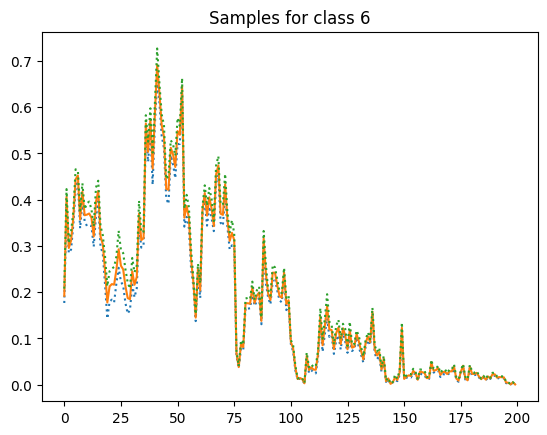

 80%|██████████████████████████████████████████████████████████▍              | 79999/100000 [2:12:20<31:59, 10.42it/s]

Iter-80000; D_loss: -0.3712560534477234; G_loss: -13.942667007446289; C_loss: 0.4019705653190613


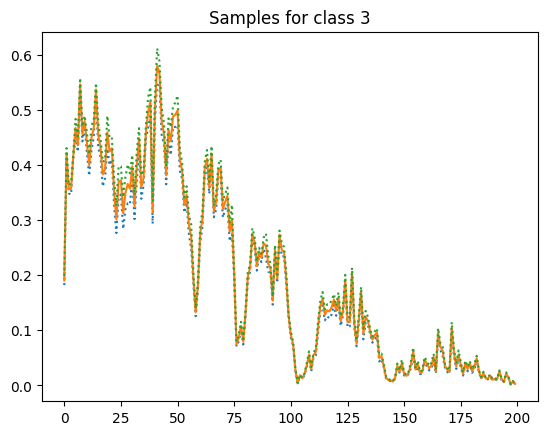

 81%|███████████████████████████████████████████████████████████▏             | 81000/100000 [2:13:58<34:40,  9.13it/s]

Iter-81000; D_loss: -0.43891650438308716; G_loss: -12.52623176574707; C_loss: 0.9453848004341125


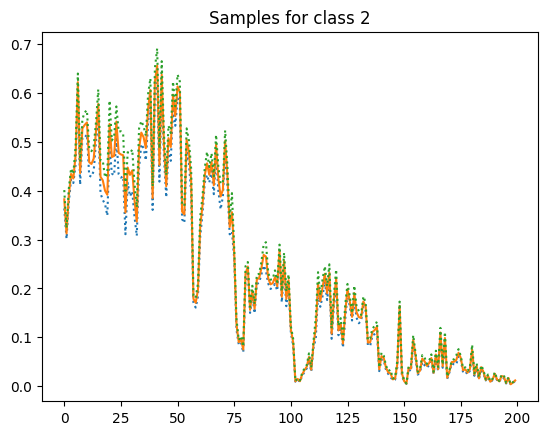

 82%|███████████████████████████████████████████████████████████▊             | 81999/100000 [2:15:37<27:51, 10.77it/s]

Iter-82000; D_loss: -0.5167413949966431; G_loss: -11.860815048217773; C_loss: 0.9277100563049316


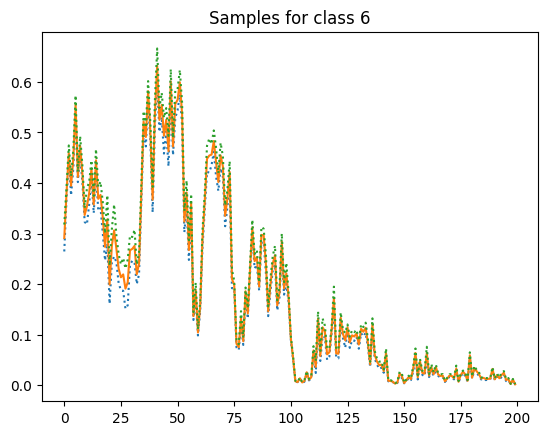

 83%|████████████████████████████████████████████████████████████▌            | 83000/100000 [2:17:15<26:50, 10.56it/s]

Iter-83000; D_loss: -0.35175251960754395; G_loss: -11.060514450073242; C_loss: 0.715954065322876


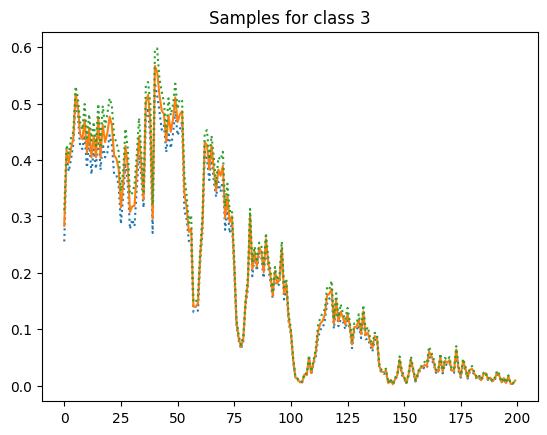

 84%|█████████████████████████████████████████████████████████████▎           | 83999/100000 [2:18:53<25:59, 10.26it/s]

Iter-84000; D_loss: -0.23762071132659912; G_loss: -10.910614013671875; C_loss: 0.768291175365448


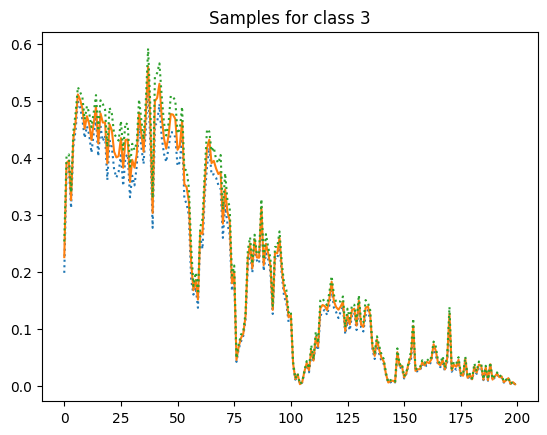

 85%|██████████████████████████████████████████████████████████████           | 84999/100000 [2:20:30<24:49, 10.07it/s]

Iter-85000; D_loss: -0.4126342535018921; G_loss: -10.359222412109375; C_loss: 1.6468563079833984


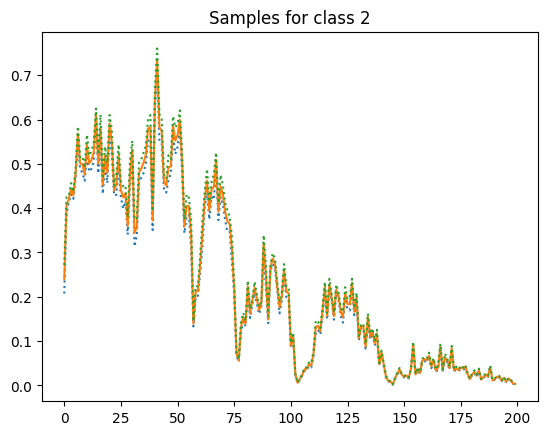

 86%|██████████████████████████████████████████████████████████████▊          | 86000/100000 [2:22:09<24:47,  9.41it/s]

Iter-86000; D_loss: -0.48586708307266235; G_loss: -10.150039672851562; C_loss: 1.63422429561615


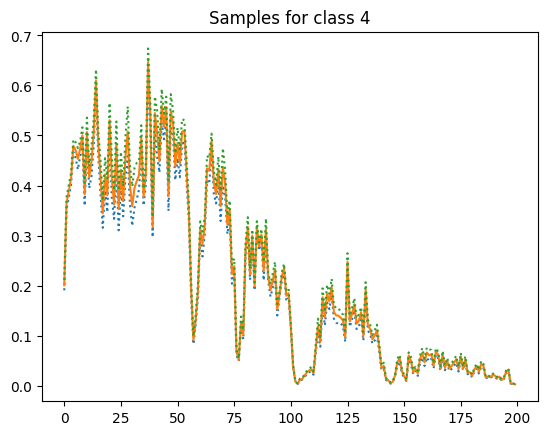

 87%|███████████████████████████████████████████████████████████████▌         | 87000/100000 [2:23:49<20:14, 10.70it/s]

Iter-87000; D_loss: -0.2725050151348114; G_loss: -9.35023307800293; C_loss: 0.3142237067222595


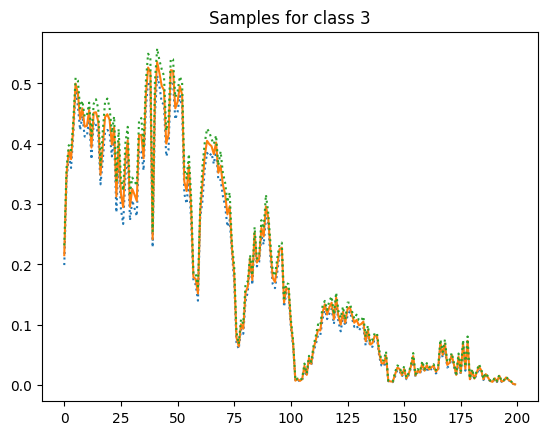

 88%|████████████████████████████████████████████████████████████████▏        | 88000/100000 [2:25:27<21:40,  9.23it/s]

Iter-88000; D_loss: -0.1934593766927719; G_loss: -9.198295593261719; C_loss: 0.5644053816795349


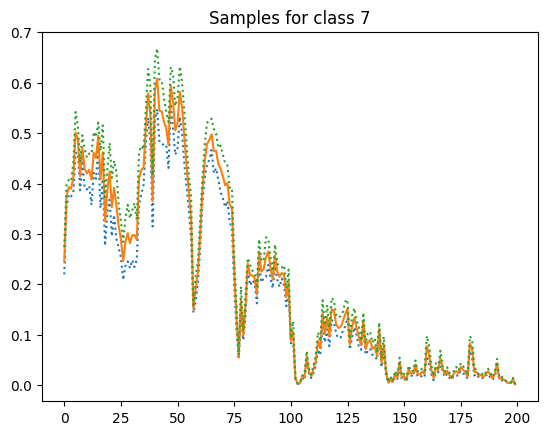

 89%|████████████████████████████████████████████████████████████████▉        | 88999/100000 [2:27:04<18:15, 10.04it/s]

Iter-89000; D_loss: -0.4201214611530304; G_loss: -8.139890670776367; C_loss: 1.3953909873962402


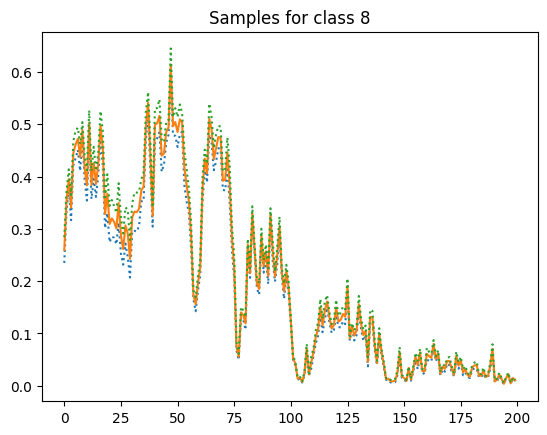

 90%|█████████████████████████████████████████████████████████████████▋       | 89999/100000 [2:28:41<15:52, 10.50it/s]

Iter-90000; D_loss: -0.3430231809616089; G_loss: -6.787162780761719; C_loss: 0.5560582876205444


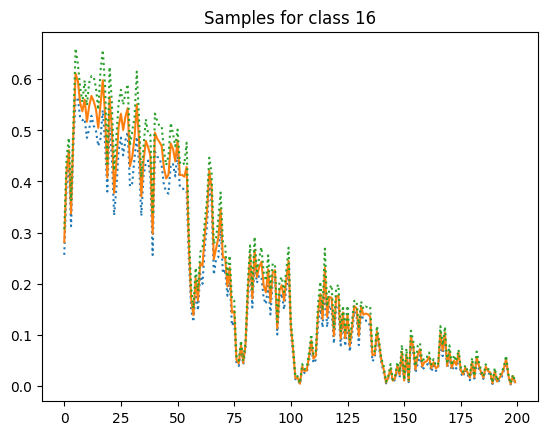

 91%|██████████████████████████████████████████████████████████████████▍      | 91000/100000 [2:30:21<15:17,  9.81it/s]

Iter-91000; D_loss: -0.5803078413009644; G_loss: -7.326967239379883; C_loss: 1.1802442073822021


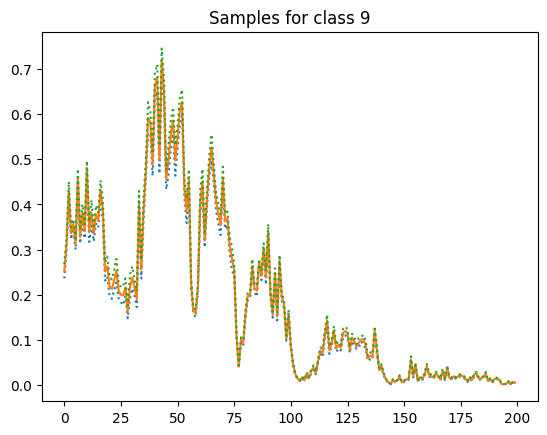

 92%|███████████████████████████████████████████████████████████████████▏     | 92000/100000 [2:31:59<13:53,  9.60it/s]

Iter-92000; D_loss: -0.44099223613739014; G_loss: -6.841933250427246; C_loss: 1.929947853088379


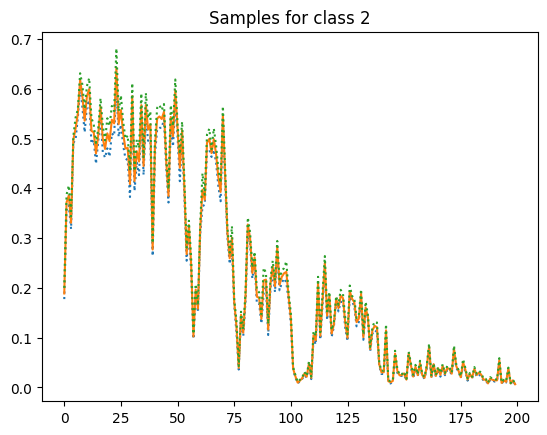

 93%|███████████████████████████████████████████████████████████████████▉     | 92999/100000 [2:33:38<12:27,  9.36it/s]

Iter-93000; D_loss: -0.06798246502876282; G_loss: -5.993437767028809; C_loss: 1.2200541496276855


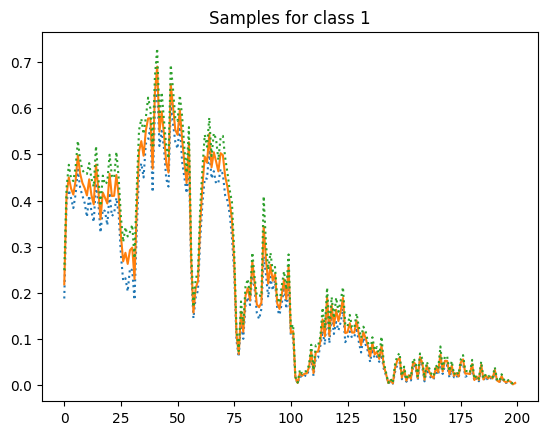

 94%|████████████████████████████████████████████████████████████████████▌    | 93999/100000 [2:35:17<08:55, 11.20it/s]

Iter-94000; D_loss: -0.3236425518989563; G_loss: -4.926416397094727; C_loss: 1.8049297332763672


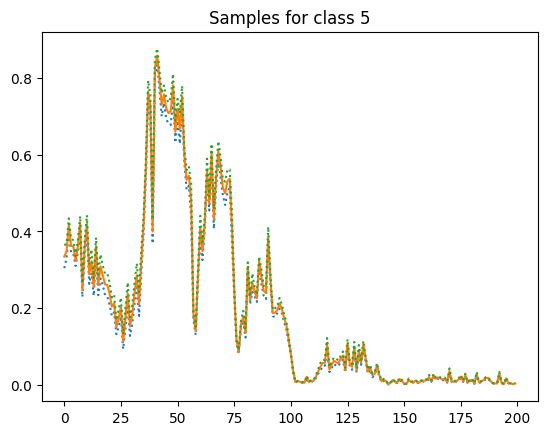

 95%|█████████████████████████████████████████████████████████████████████▎   | 95000/100000 [2:36:55<07:37, 10.93it/s]

Iter-95000; D_loss: -0.27515289187431335; G_loss: -5.144356727600098; C_loss: 0.5723328590393066


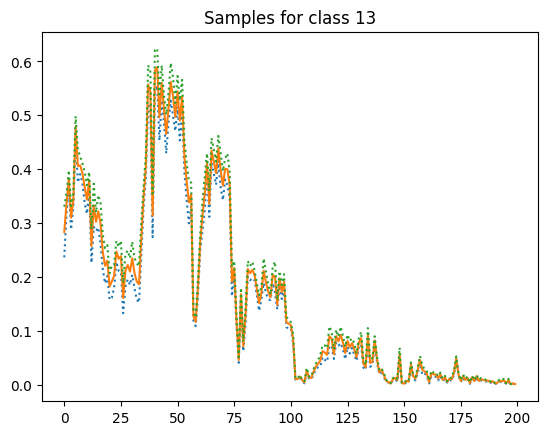

 96%|██████████████████████████████████████████████████████████████████████   | 95999/100000 [2:38:33<05:54, 11.29it/s]

Iter-96000; D_loss: -0.30030423402786255; G_loss: -4.864534854888916; C_loss: 0.5665054321289062


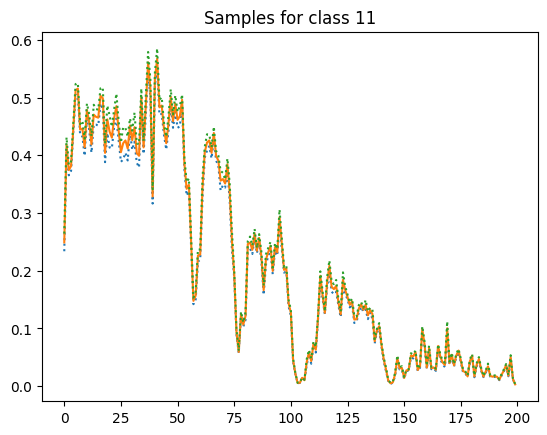

 97%|██████████████████████████████████████████████████████████████████████▊  | 97000/100000 [2:40:15<04:50, 10.34it/s]

Iter-97000; D_loss: -0.4026389718055725; G_loss: -5.459881782531738; C_loss: 0.9608277678489685


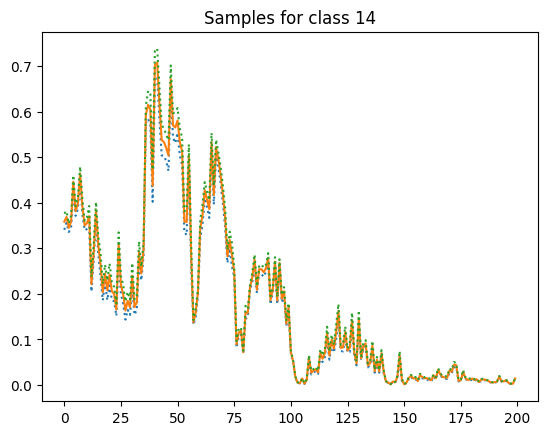

 98%|███████████████████████████████████████████████████████████████████████▌ | 98000/100000 [2:41:54<03:10, 10.48it/s]

Iter-98000; D_loss: -0.2336583435535431; G_loss: -4.720763683319092; C_loss: 1.170643925666809


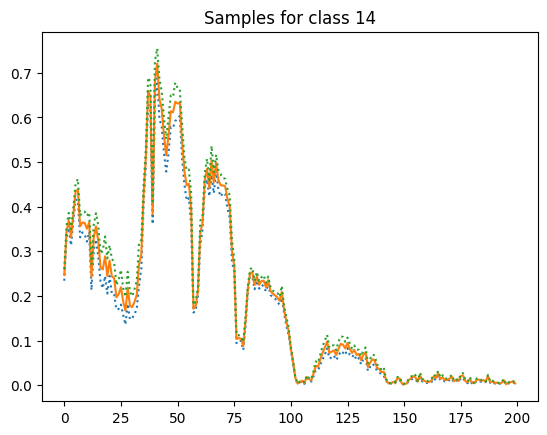

 99%|████████████████████████████████████████████████████████████████████████▎| 98999/100000 [2:43:33<01:37, 10.25it/s]

Iter-99000; D_loss: -0.5325568914413452; G_loss: -4.811902046203613; C_loss: 1.0707014799118042


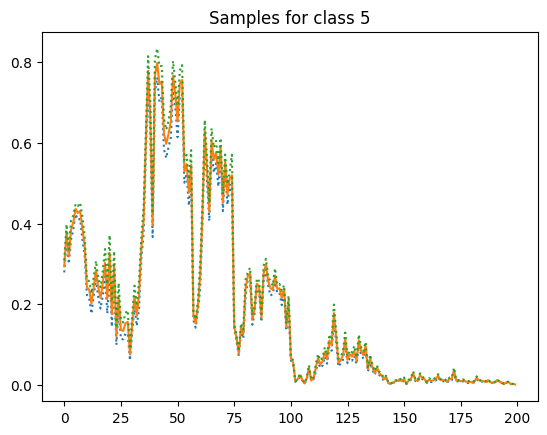

100%|████████████████████████████████████████████████████████████████████████| 100000/100000 [2:45:10<00:00, 10.09it/s]


In [9]:
import torch.optim as optim
# Get networks
G = Generator().cuda()
D = Discriminator().cuda()
C = Classifier().cuda()
# Use RMSProp optimizer
G_solver = optim.RMSprop(G.parameters(), lr=lr)
D_solver = optim.RMSprop(D.parameters(), lr=lr)
C_solver = optim.RMSprop(C.parameters(), lr=lr)

for it in tqdm(range(100000)):
    ###########################
    # (1) Update C and D      #
    ###########################
    for p in D.parameters():  # reset requires_grad
        p.requires_grad = True  # they are set to False below in netG update
    for p in C.parameters():
        p.requires_grad = True
    
    # D is trained d_step times for each iteration
    for _, (X, y), (X_, y_) in zip(range(d_step), data_loader, data_loader):
        D.zero_grad()

        # Sample random noise
        z = torch.randn(y.size(0), z_dim).squeeze()
        X, y = X.float(), y.float()
        X_, y_ = X_.float(), y_.float()
        # Mixup
        lam = np.random.beta(mixup_alpha, mixup_alpha)
        X = lam*X + (1. - lam)*X_
        X, y, z = X.cuda(), y.cuda(), z.cuda()
        y_ = y_.cuda()
        
        # Get discriminator prediction on real samples
        D_real = D(X).mean()
        # Get discriminator prediction on fake samples
        fake_samples = G(z, y)
        D_fake = D(fake_samples).mean()
        # Compute gradient penalty
        gradient_penalty = calc_gradient_penalty(D, X.data, fake_samples.data)
        # Compute loss and backpropagate
        D_loss = D_fake - D_real + gradient_penalty
        flip = np.random.random() < flip_percentage
        if flip: 
            # Flip real and fake
            gradient_penalty = calc_gradient_penalty(D, fake_samples.data, X.data)
            D_loss = D_real - D_fake + gradient_penalty
        D_loss.backward()
        D_solver.step()
    
        ######################
        #  Update C network  #
        ######################
        C.zero_grad()
        # Get class values
        _, classes = torch.max(y, dim=1)
        _, classes_ = torch.max(y_, dim=1)
        # Get predictions from C
        if flip:
            fake_samples = G(z, y)
            pred = C(fake_samples)
            # Compute loss and backpropagate
            C_loss = F.cross_entropy(pred, classes, weight=class_weights)
        else:
            pred = F.log_softmax(C(X))
            C_loss = lam * F.nll_loss(pred, classes) + (1. - lam) * F.nll_loss(pred, classes_)
        C_loss.backward()
        C_solver.step()


    ############################
    # (2) Update G network
    ###########################
    for p in D.parameters():
        p.requires_grad = False  # to avoid computation
    for p in C.parameters():
        p.requires_grad = False
    reset_grad(C, G, D)

    # Sample random noise
    z = torch.randn(y.size(0), z_dim).squeeze()
    z = z.cuda()
    # Generate fake samples
    G_sample = G(z, y)
    D_fake = D(G_sample)
    pred = C(G_sample)
    C_loss = F.cross_entropy(pred, classes, weight=class_weights)
    # Fool the discriminator (WGAN)
    G_loss = -torch.mean(D_fake)
    # Include the auxialiary classifier loss (AC-GAN)
    loss = G_loss + c_weight * C_loss
    # Backpropagate
    loss.backward()
    G_solver.step()

    # Print and plot every now and then
    if it % 1000 == 0:
        with torch.no_grad():
            print('Iter-{}; D_loss: {}; G_loss: {}; C_loss: {}'.format(it,
                                                           D_loss.data.cpu().numpy(), G_loss.data.cpu().numpy(),
                                                           C_loss.data.cpu().numpy()))
            z = torch.randn(mb_size, z_dim).squeeze().cuda()
            c = np.zeros(shape=[mb_size, c_dim], dtype='float32')
            idx = np.random.randint(1, data_loader.dataset.n_classes)
            c[:, idx] = 1.
            c = torch.from_numpy(c).squeeze().cuda()
            samples = G(z, c).data.cpu().numpy()[:16]
            pred = G(z, c)
            plot_mean_std(samples)
            plt.title("Samples for class {}".format(idx))
            plt.show()


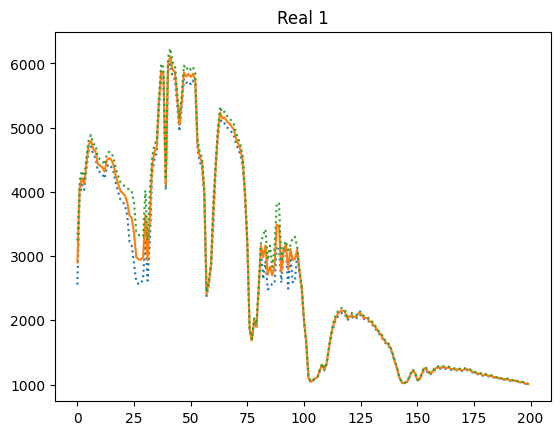

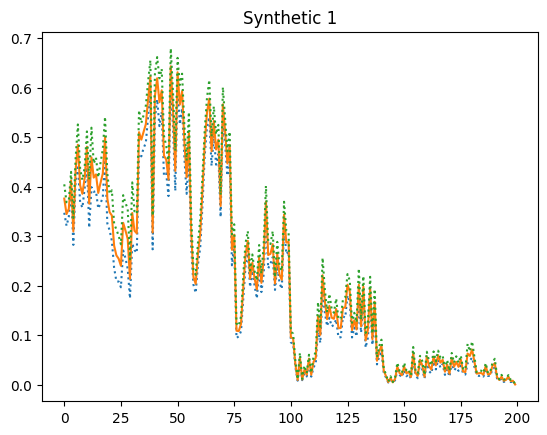

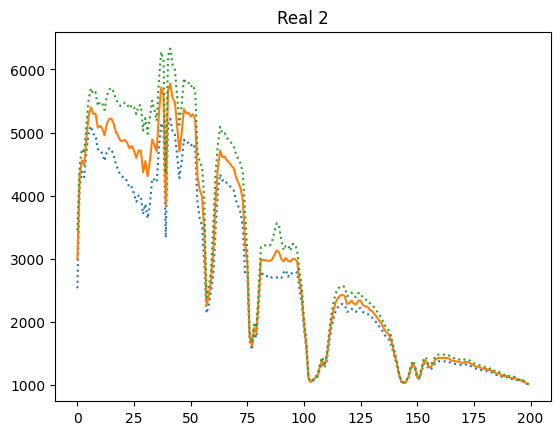

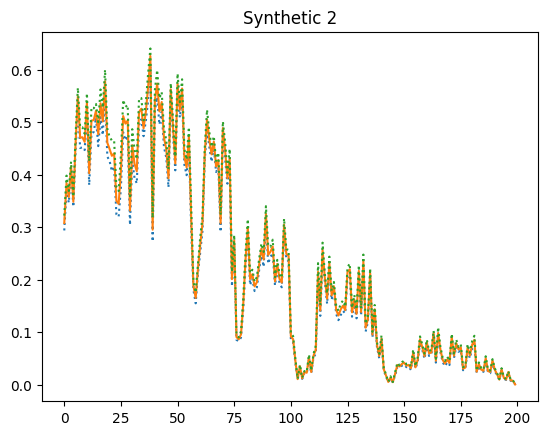

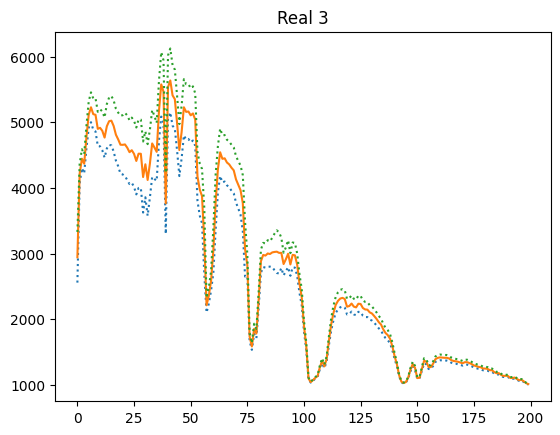

...

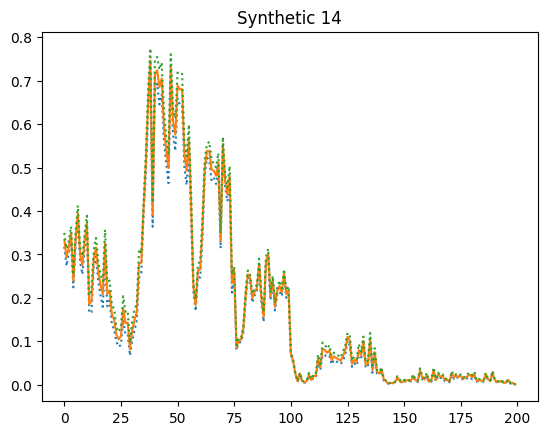

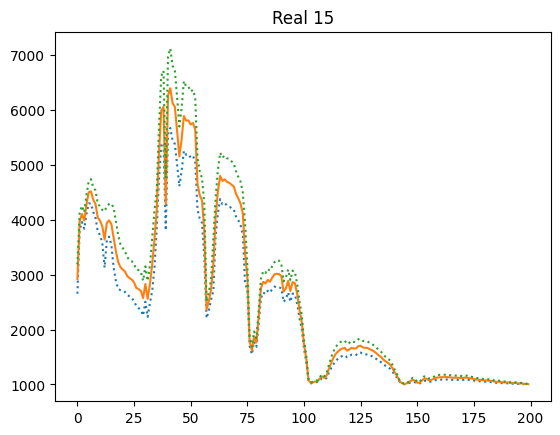

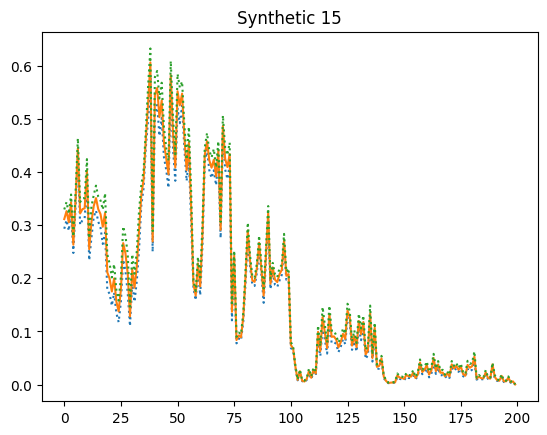

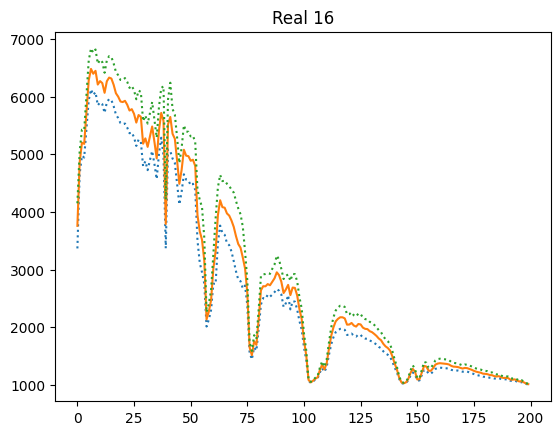

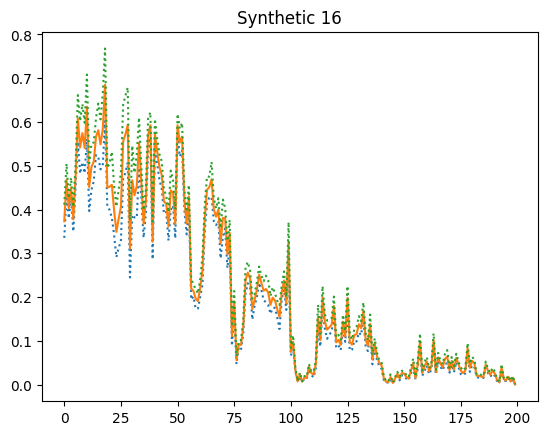

In [10]:
for c in np.unique(gt):
    # 0 is the "undefined" class
    if c == 0:
        continue
    
    # Get the mean spectrum +- std for this class
    spectras = img[gt == c, :]
    plot_mean_std(spectras)
    plt.title("Real {}".format(c))
    plt.show()
    
    # Get as many fake spectras as real ones
    synthetic_spectras = []
    with torch.no_grad():
        while len(synthetic_spectras) < len(spectras):
            z = torch.randn(mb_size, z_dim).cuda()
            y = torch.from_numpy(np.eye(data_loader.dataset.n_classes)[c]).float()
            y = y.unsqueeze(0).repeat(mb_size, 1).cuda()
            G_sample = G(z, y)
            _, classes = torch.max(y, 1)
            _, pred = torch.max(C(G_sample), 1)
            synthetic_spectras += list(G_sample.cpu().data.numpy())
    plt.show()
    plot_mean_std(synthetic_spectras)
    plt.title("Synthetic {}".format(c))
    plt.show()

In [11]:
import sklearn.svm
import sklearn.model_selection
import sklearn.preprocessing
import sklearn.pipeline
import sklearn.mixture

In [12]:
img = (img - img.min()) / (img.max() - img.min())
X_train = np.array([img[x,y] for x,y in zip(*np.nonzero(train_gt))])
y_train = np.array([gt[x,y] for x,y in zip(*np.nonzero(train_gt))])
X_test = np.array([img[x,y] for x,y in zip(*np.nonzero(test_gt))])
y_test = np.array([test_gt[x,y] for x,y in zip(*np.nonzero(test_gt))])

In [16]:
# gmms = [sklearn.mixture.GaussianMixture(n_components=20) for _ in range(c_dim)]
# for y in np.unique(y_train):
#     gmms[y].fit(X_train[y_train == y])

from sklearn.mixture import GaussianMixture
import numpy as np

# Initialize GMMs
gmms = [None] * c_dim

# Fit GMMs to each class with enough samples
for y in np.unique(y_train):
    # Get the samples for class y
    samples = X_train[y_train == y]
    # Check if there are at least two samples for this class
    if samples.shape[0] >= 2:
        # Set the number of components to be the min between the desired number and the number of samples
        n_components = min(20, samples.shape[0])
        gmms[y] = GaussianMixture(n_components=n_components)
        gmms[y].fit(samples)
    else:
        print(f"Not enough samples for class {y} to fit a GMM.")




Not enough samples for class 7 to fit a GMM.
Not enough samples for class 9 to fit a GMM.


In [17]:
def gmm_create_fake_dataset(gmms, y):
    fake_X = []
    y_fake = []
    for y in np.unique(y):
        n_samples = np.count_nonzero(y_test == y)
        samples = gmms[y].sample(n_samples)[0]
        fake_X.append(samples)
        y_fake += [y] * n_samples
    fake_X = np.concatenate(fake_X)
    y_fake = np.array(y_fake)
    return fake_X, y_fake

#fake_X_train, fake_y_train = gmm_create_fake_dataset(gmms, y_train)
#fake_X_test, fake_y_test = gmm_create_fake_dataset(gmms, y_test)

In [18]:
scaler = sklearn.preprocessing.StandardScaler()
svm = sklearn.svm.SVC()
#estimator = sklearn.pipeline.Pipeline(steps=[('scaler', scaler), ('svm', svm)])
estimator = sklearn.pipeline.Pipeline(steps=[('svm', svm)])
#tuned_parameters = {'svm__C': [0.1, 1, 10, 100, 1000], 'svm__kernel': ['linear']}
tuned_parameters = {'svm__C': [1000], 'svm__kernel': ['linear']}
clf = sklearn.model_selection.GridSearchCV(estimator, tuned_parameters, cv=5, n_jobs=4)
clf.fit(X_train, y_train)
score = clf.score(X_test, y_test)
best_params = clf.best_params_
print("The best SVM was obtained using {} and performed at {:.2f} accuracy.".format(best_params, 100 * score))

C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


The best SVM was obtained using {'svm__C': 1000, 'svm__kernel': 'linear'} and performed at 73.96 accuracy.


In [19]:
y_pred = clf.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.55      0.67      0.60        43
           2       0.64      0.73      0.68      1351
           3       0.56      0.56      0.56       784
           4       0.59      0.32      0.42       231
           5       0.76      0.88      0.81       458
           6       0.89      0.95      0.92       692
           7       0.00      0.00      0.00        27
           8       0.93      0.96      0.94       456
           9       0.25      0.16      0.19        19
          10       0.71      0.62      0.66       916
          11       0.69      0.78      0.73      2330
          12       0.76      0.37      0.50       564
          13       0.90      0.95      0.93       195
          14       0.93      0.93      0.93      1212
          15       0.69      0.52      0.59       369
          16       0.99      0.89      0.93        88

    accuracy                           0.74      9735
   macro avg       0.68   

In [20]:
def gan_create_fake_dataset(labels):
    with torch.no_grad():
        spectras = []
        for l in np.array_split(labels, len(labels) // mb_size):
            z = torch.randn(len(l), z_dim).cuda()
            y = np.zeros((len(l), data_loader.dataset.n_classes))
            for i, label in enumerate(l):
                y[i] = np.eye(data_loader.dataset.n_classes)[label]
            y = torch.from_numpy(y).float()
            eps = torch.randn(y.size())/10
            #y += eps
            y = y.cuda()
            G_sample = G(z, y)
            spectras += list(G_sample.cpu().data.numpy())
        return np.array(spectras), np.array(labels)

In [21]:
fake_X_train, fake_y_train = gan_create_fake_dataset(y_train)
fake_X_test, fake_y_test = gan_create_fake_dataset(y_test)

In [22]:
clf.score(fake_X_test, fake_y_test)

0.3684643040575244

In [23]:
y_fake_pred = clf.predict(fake_X_test)
from sklearn.metrics import classification_report
print(classification_report(fake_y_test, y_fake_pred))

              precision    recall  f1-score   support

           1       0.74      0.74      0.74        43
           2       0.97      0.09      0.16      1351
           3       0.00      0.00      0.00       784
           4       0.00      0.00      0.00       231
           5       0.47      1.00      0.64       458
           6       0.99      0.97      0.98       692
           7       0.00      0.00      0.00        27
           8       0.95      0.93      0.94       456
           9       0.00      0.00      0.00        19
          10       0.00      0.00      0.00       916
          11       0.06      0.00      0.00      2330
          12       0.09      0.99      0.17       564
          13       1.00      0.21      0.34       195
          14       0.99      0.88      0.93      1212
          15       0.61      0.48      0.54       369
          16       1.00      0.43      0.60        88

    accuracy                           0.37      9735
   macro avg       0.49   

C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ursti\anaconda3\envs\HICGAN\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [24]:
svm_fake = sklearn.svm.SVC()
clf_fake = sklearn.pipeline.Pipeline(steps=[('svm', svm_fake)])
clf_fake.set_params(**clf.best_params_)
clf_fake.fit(np.concatenate([fake_X_train]), np.concatenate([fake_y_train]))

Pipeline(steps=[('svm', SVC(C=1000, kernel='linear'))])

In [25]:
clf_fake.score(fake_X_test, fake_y_test)

0.9875706214689266

In [26]:
clf_fake.score(X_test, y_test)

0.34689265536723163

In [27]:
svm_augmented = sklearn.svm.SVC()
#clf_augmented = sklearn.pipeline.Pipeline(steps=[('scaler', scaler), ('svm', svm_augmented)])
clf_augmented = sklearn.pipeline.Pipeline(steps=[('svm', svm_augmented)])
clf_augmented.set_params(**clf.best_params_)
clf_augmented.fit(np.concatenate([X_train, fake_X_train]), np.concatenate([y_train, fake_y_train]))

Pipeline(steps=[('svm', SVC(C=1000, kernel='linear'))])

In [28]:
clf_augmented.score(X_test, y_test)

0.7356959424756034

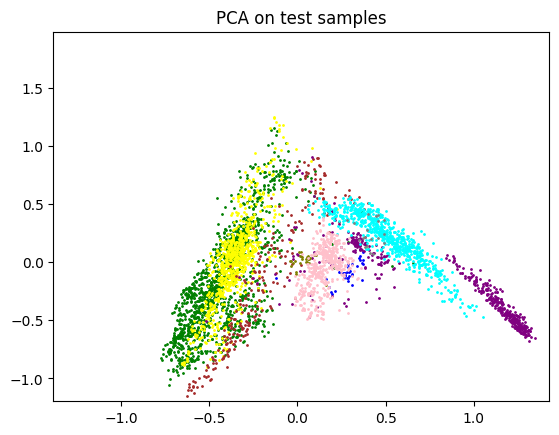

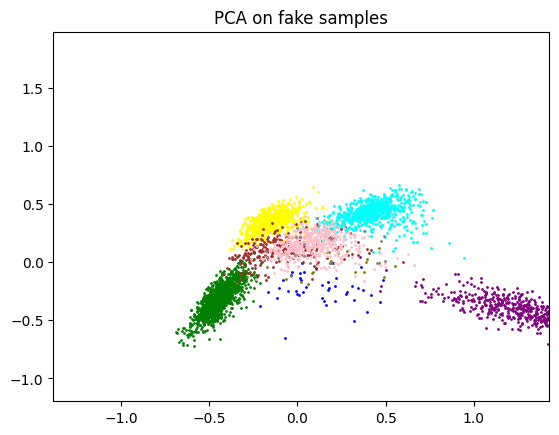

In [29]:
%matplotlib inline
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_test)
x_min, x_max = np.min(X_pca[:,0]), np.max(X_pca[:,0])
y_min, y_max = np.min(X_pca[:,1]), np.max(X_pca[:,1])

colors = ['red', 'blue', 'green', 'yellow', 'brown', 'purple', 'cyan', 'olive', 'pink', 'gray']
for i, color in enumerate(colors):
    idx = y_test == i
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1], c=color, s=1)
    plt.ylim(y_min, y_max)
    plt.xlim(x_min, x_max)
    plt.title('PCA on test samples')
plt.show()

X_fake_pca = pca.transform(fake_X_test)
for i, color in enumerate(colors):
    idx = fake_y_test == i
    plt.scatter(X_fake_pca[idx, 0], X_fake_pca[idx, 1], s=1, c=color)
    plt.ylim(y_min, y_max)
    plt.xlim(x_min, x_max)
    plt.title('PCA on fake samples')
plt.show()

In [30]:
def train(net, X_train, y_train, epochs=100):
    dataset = torch.utils.data.TensorDataset(torch.from_numpy(X_train).float(),
                                             torch.from_numpy(y_train).long())
    loader = torch.utils.data.DataLoader(dataset, batch_size=1024, shuffle=True)
    solver = optim.Adam(net.parameters(), amsgrad=True)
    net.train()
    it = 0
    losses = []
    for _ in tqdm(range(epochs)):
        for X, y in loader:
            it += 1
            net.zero_grad()
            X, y = X.cuda(), y.cuda()
            out = net(X)
            loss = F.cross_entropy(out, y)
            loss.backward()
            solver.step()
            losses.append(loss.item())
            if it % 10000 == 0:
                print("Loss at {} = {}".format(it, loss.item()))
                plt.plot(losses) and plt.show()
    return net

 67%|███████████████████████████████████████████████████▎                         | 9991/15000 [01:54<00:54, 92.67it/s]

Loss at 10000 = 0.015924427658319473


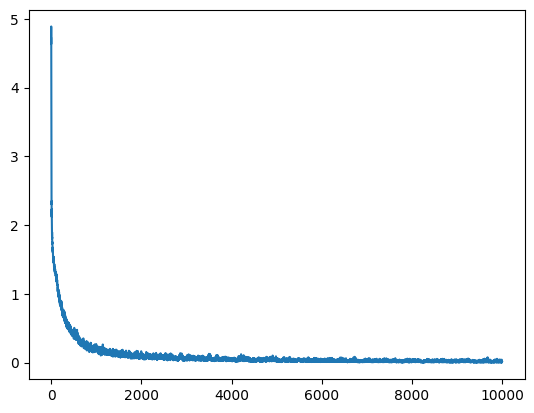

100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [02:52<00:00, 86.98it/s]


In [31]:
C_real = train(Classifier().cuda(), X_train, y_train, epochs=15000)

In [32]:
def test(net, X_test, y_test):
    with torch.no_grad():
        net.eval()
        print(X_test.shape)
        print(y_test.shape)
        dataset = torch.utils.data.TensorDataset(torch.from_numpy(X_test).float(),
                                                 torch.from_numpy(y_test).long())
        loader = torch.utils.data.DataLoader(dataset, batch_size=mb_size)
        pred = []
        for X, y in loader:
            X, y = X.cuda(), y.cuda()
            out = net(X)
            _, out = torch.max(out, 1)
            pred.append(out.cpu().numpy())
        pred = np.concatenate(pred)
        print(classification_report(y_test, pred, digits=4))
    return pred

In [33]:
test(C_real, X_test, y_test)

(9735, 200)
(9735,)
              precision    recall  f1-score   support

           1     0.6333    0.4419    0.5205        43
           2     0.6322    0.7469    0.6848      1351
           3     0.6248    0.6543    0.6393       784
           4     0.5030    0.3593    0.4192       231
           5     0.8344    0.8581    0.8461       458
           6     0.9085    0.9321    0.9201       692
           7     0.0000    0.0000    0.0000        27
           8     0.8662    0.9934    0.9254       456
           9     0.6429    0.4737    0.5455        19
          10     0.7333    0.7686    0.7505       916
          11     0.8152    0.7481    0.7802      2330
          12     0.6177    0.4699    0.5337       564
          13     0.7500    0.9846    0.8514       195
          14     0.9076    0.9241    0.9158      1212
          15     0.6084    0.4715    0.5313       369
          16     0.8737    0.9432    0.9071        88

    accuracy                         0.7607      9735
   mac

array([ 3,  3, 11, ..., 10, 11, 11], dtype=int64)

 33%|█████████████████████████▋                                                   | 4997/15000 [02:17<04:30, 36.98it/s]

Loss at 10000 = 0.7022086381912231


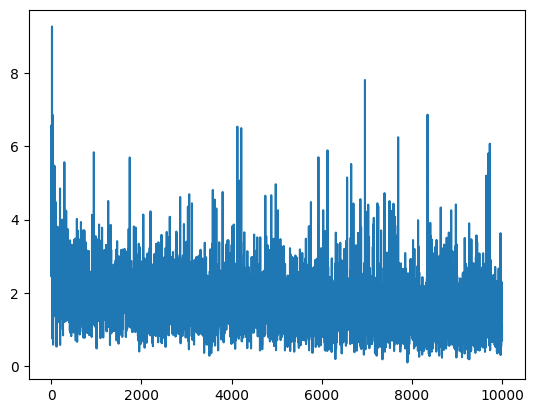

 67%|███████████████████████████████████████████████████▎                         | 9999/15000 [04:26<02:16, 36.60it/s]

Loss at 20000 = 0.5459750294685364


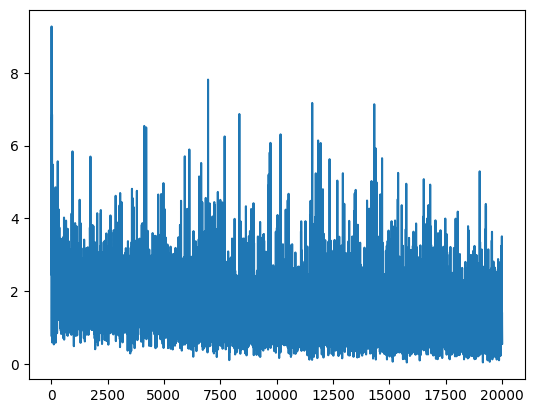

 79%|███████████████████████████████████████████████████████████▊                | 11800/15000 [05:18<02:01, 26.30it/s]

In [ ]:
C_fake = train(Classifier().cuda(), np.concatenate((X_train, fake_X_train)), np.concatenate((y_train, fake_y_train)), epochs=15000)

In [ ]:
test(C_fake, X_test, y_test)